<a href="https://colab.research.google.com/github/gerdac/instance_segmentation_thermal/blob/main/5_Calculating_uvalues.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Module imports

## Install detectron2


<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">


Detectron2 Tutorial https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5#scrollTo=dq9GY37ml1kr from the read the docs https://detectron2.readthedocs.io/en/latest/tutorials/getting_started.html

In [2]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 2.0 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15508, done.
remote: Counting objects: 100% (233/233), done.
remote: Compressing objects: 100% (194/194), done.
remote: Total 15508 (delta 66), reused 180 (delta 39), pack-reused 15275
Receiving objects: 100% (15508/15508), 6.39 MiB | 19.64 MiB/s, done.
Resolving deltas: 100% (11180/11180), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.0 MB/s eta 0:00:

In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.2 ; cuda:  cu121
detectron2: 0.6


In [4]:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader, build_detection_train_loader, DatasetMapper
from detectron2.data import detection_utils as utils
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.checkpoint import DetectionCheckpointer, Checkpointer
from detectron2.structures import Instances

import detectron2.data.transforms as T



## Some basic setup

In [5]:
# import some common libraries
import numpy as np
import os, json, cv2, random, copy
from google.colab.patches import cv2_imshow

# import utilities for visualization
from PIL import Image
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
sns.set(color_codes=True)

In [6]:
!pip install sensitivity
from sensitivity import SensitivityAnalyzer
# https://nickderobertis.github.io/sensitivity/tutorial.html#install
# https://nickderobertis.github.io/sensitivity/auto_examples/sensitivity_analysis.html

# ??? ANOTHER SENSITIVITY ANALYSIS OPTION https://colab.research.google.com/github/Xifus/SA-lab/blob/master/Sensitivity_Analysis_Lab.ipynb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.5 MB/s eta 0:00:00


In [7]:
# Mount google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Loading saved model

### Load training dataset and validation dataset

In [8]:
# Establish training, validation and test sets directly from google drive
register_coco_instances("coco_dataset_train", {}, "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/thermal23/images/Train/output.json", "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/thermal23/images/Train")
register_coco_instances("coco_dataset_val", {}, "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/thermal23/images/Validate/output.json", "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/thermal23/images/Validate")
register_coco_instances("coco_dataset_test", {}, "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/thermal23/images/Test/output.json", "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/thermal23/images/Test")

In [9]:
register_coco_instances("coco_dataset_all", {}, "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/thermal23/images/output.json", "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/thermal23/images")

In [10]:
# Register validation dataset
register_coco_instances("validation_z1", {}, "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/validation/images/Z1/output.json", "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/validation/images/Z1")
register_coco_instances("validation_z3", {}, "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/validation/images/Z3/output.json", "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/validation/images/Z3")
register_coco_instances("validation_all", {}, "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/validation/images/output.json", "/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/validation/images")

### Load model checkpoint

In [11]:
modelversion_load = '20240314_transforms_5000_all'
modelname_load = "instancethermal_"+modelversion_load+'.pth'
modelckptpath = os.path.join("/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/output", modelname_load)

In [12]:
# #load checkpoint
# DetectionCheckpointer(trainer.model).load(modelckptpath)

In [13]:
class MyTrainer(DefaultTrainer):

    @classmethod
    def build_train_loader(cls, cfg):
        mapper = DatasetMapper(cfg, is_train=True, augmentations=
         [T.Resize((800, 800)),
          T.RandomBrightness(0.8, 1.8),
          T.RandomContrast(0.6, 1.3),
          T.RandomSaturation(0.8, 1.4),
          # T.RandomRotation(angle=[90, 90]),
          T.RandomLighting(0.7),
          T.RandomFlip(prob=0.4, horizontal=False, vertical=True),])
        return build_detection_train_loader(cfg, mapper=mapper)

In [15]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ('coco_dataset_all',)
cfg.DATASETS.TEST = ("coco_dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.0005  # pick a good LR
cfg.SOLVER.MAX_ITER = 500    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = (4000, 4500)        # do not decay learning rate
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(MetadataCatalog.get('coco_dataset_all').thing_classes)

trainer = MyTrainer(cfg)

#load checkpoint
DetectionCheckpointer(trainer.model).load(modelckptpath)
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
cfg.MODEL.WEIGHTS = modelckptpath  # path to the model we just trained


[03/18 11:22:13 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

### Evaluate loaded model

In [16]:
# Evaluate model

evaluator = COCOEvaluator("coco_dataset_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "coco_dataset_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

[03/18 11:22:46 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [03/18 11:22:46 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[03/18 11:22:46 d2.data.datasets.coco]: Loaded 6 images in COCO format from /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/thermal23/images/Validate/output.json
[03/18 11:22:46 d2.data.build]: Distribution of instances among all 10 categories:
|  category  | #instances   |   category    | #instances   |   category    | #instances   |
|:----------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|    wall    | 22           | window glaz.. | 132          |     door      | 2            |
|   window   | 36           | window frame  | 7            | thermal bri.. | 46           |
| door frame | 2            |     floor     |

/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/18 11:22:50 d2.evaluation.evaluator]: Total inference time: 0:00:00.227644 (0.227644 s / iter per device, on 1 devices)
[03/18 11:22:50 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.117544 s / iter per device, on 1 devices)
[03/18 11:22:50 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[03/18 11:22:50 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[03/18 11:22:50 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.423
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.523
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.470
 Average

OrderedDict([('bbox',
              {'AP': 42.305188816048314,
               'AP50': 52.295130672344,
               'AP75': 46.99755331198497,
               'APs': 33.38078793740824,
               'APm': 36.17417448317736,
               'APl': 69.07179382350532,
               'AP-wall': 44.040203010065895,
               'AP-window glazing': 63.15032480576742,
               'AP-door': 0.0,
               'AP-window': 74.65887874281661,
               'AP-window frame': 17.524752475247524,
               'AP-thermal bridge': 43.81033482413026,
               'AP-door frame': 0.0,
               'AP-floor': 100.0,
               'AP-door door': 0.0,
               'AP-other': 79.86739430245545}),
             ('segm',
              {'AP': 37.997900417252126,
               'AP50': 49.466938329697044,
               'AP75': 44.56042088667005,
               'APs': 34.02038741408611,
               'APm': 32.82520558002934,
               'APl': 57.98245665731987,
               'AP

In [17]:
#Setting metadata
my_dataset_val_metadata = MetadataCatalog.get(cfg.DATASETS.TEST[0])
my_dataset_train_metadata = MetadataCatalog.get(cfg.DATASETS.TRAIN[0])

In [18]:
# Setting predictor and threshold
cfg.MODEL.WEIGHTS = modelckptpath
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9
predictor = DefaultPredictor(cfg)

[03/18 11:22:52 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/output/instancethermal_20240314_transforms_5000_all.pth ...


#### Validation dataset

[03/18 11:22:52 d2.data.datasets.coco]: Loaded 6 images in COCO format from /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/thermal23/images/Validate/output.json
/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/thermal23/images/Validate/IR_540.jpg


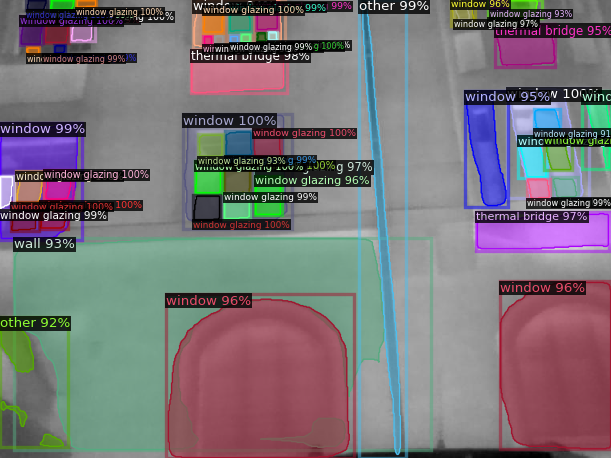

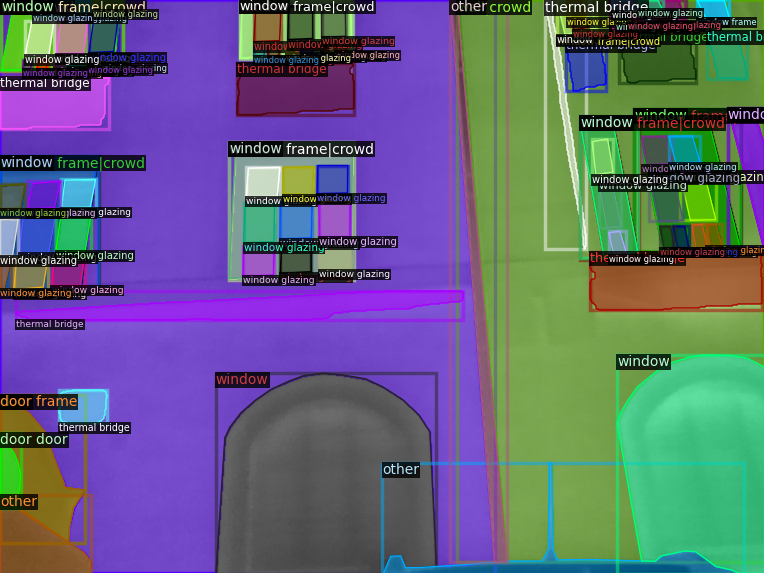

/content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/thermal23/images/Validate/IR_550.jpg


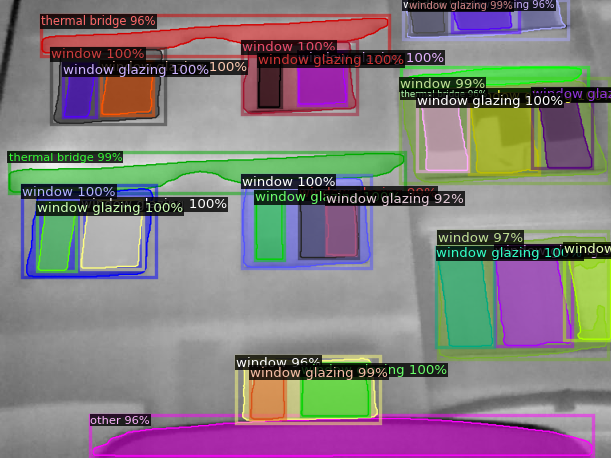

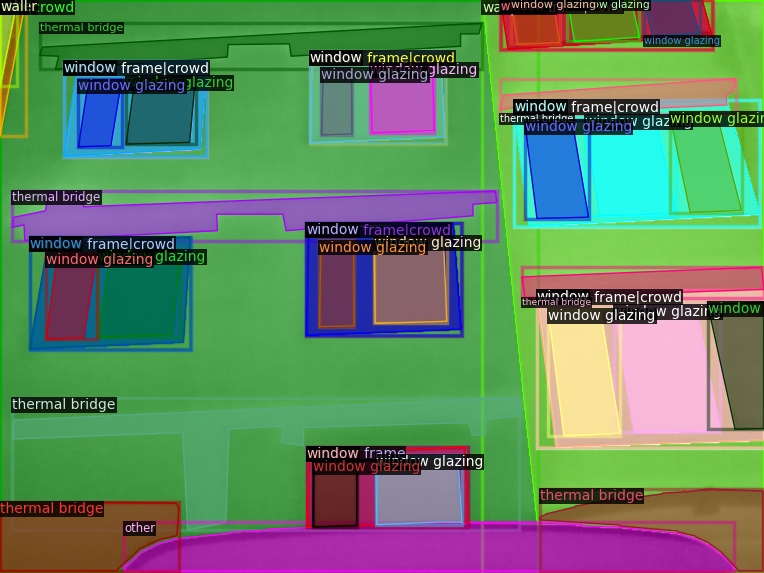

In [19]:
#visualize validation data

dataset_dicts = DatasetCatalog.get("coco_dataset_val")

for d in random.sample(dataset_dicts, 2):
    print (d["file_name"])
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)

    v = Visualizer(img[:, :, ::-1],
                  metadata = my_dataset_train_metadata,
                  scale=0.8
                  )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])
    visualizer = Visualizer(img[:, :, ::-1],
                            metadata = my_dataset_train_metadata,
                            scale=1)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Formulas Definition

## U-value windows

In [20]:
h_ensav = 9.09
h_stand = 7.69

def uvalue_win_calc(t_ic, t_ec, t_ie, t_ee, t_if, t_ef, a_c, a_e, a_f, h = bool):
  t_it = t_ic + t_ie + t_if
  t_et = t_ec + t_ee + t_ef

  a_t = a_c + a_e + a_f

  w = t_it - t_et #total
  x = t_ic - t_ec #center
  y = t_ie - t_ee #edge
  z = t_if - t_ef #frame

  if h == 1:
    h = h_ensav
  else:
    h = h_stand

  u_c = h*x/w
  u_e = h*y/w
  u_f = h*z/w

  u_win_t = (u_c*a_c + u_e*a_e + u_f*a_f)/a_t

  return u_win_t


In [21]:
uvalue_win_calc(16, 4, 16, 4, 16, 4, 75, 12.5, 12.5)

2.563333333333334

In [22]:
h_ensav = 9.09
h_stand = 7.69

def uvalue_win_calc(t_ic, t_ec, t_ie, t_ee, t_if, t_ef, a_c, a_e = None, a_f = None, h = bool):
  t_it = t_ic + t_ie + t_if
  t_et = t_ec + t_ee + t_ef

  if a_e == None and a_f == None:
    a_e = (100 - a_c)/2
    a_f = a_e
  elif a_e == None:
    a_e = 100 - a_f
  else:
    a_f = 100 - a_e


  a_t = a_c + a_e + a_f

  w = t_it - t_et #total
  x = t_ic - t_ec #center
  y = t_ie - t_ee #edge
  z = t_if - t_ef #frame

  if h == 1:
    h = h_ensav
  else:
    h = h_stand

  u_c = h*x/w
  u_e = h*y/w
  u_f = h*z/w

  u_win_t = (u_c*a_c + u_e*a_e + u_f*a_f)/a_t

  return u_win_t


In [23]:
uvalue_win_calc(16, 4, 16, 4, 16, 4, 75)

2.563333333333334

## U-value calculation

In [24]:
#define function
def uvalue_calc(ev,t_i,t_out,t_int,vel):
  ti = t_i + 273.15
  tout = t_out + 273.15
  tint = t_int + 273.15
  uvalue = (5.67*ev*(np.float_power((ti/100), 4)-np.float_power((tout/100), 4))+3.8054*vel*(ti-tout))/(tint-tout)
  return uvalue


In [25]:
# Test
Kelvin = 273.15
ref_temp = .5
i_temp = 6.3
out_temp = ref_temp
int_temp = 22
v = 0
e_v = 0.9

T_int = int_temp + Kelvin
T_out = out_temp + Kelvin
T_i = i_temp + Kelvin

# Jurges equation Dallo paper 2013
h_we = 5.8 + 3.8054*v
h_we9 = 5.8*e_v + 3.8054*v
print(h_we)
Ud = h_we*((T_i-T_out)/(T_int-T_out))
print(Ud)
print(h_we9)
Ud9 = h_we9*((T_i-T_out)/(T_int-T_out))
print(Ud9)

# Uvalue calculation Albatici paper 2015
U = (5.67*e_v*(np.float_power((T_i/100), 4)-np.float_power((T_out/100), 4))+3.8054*v*(T_i-T_out))/(T_int-T_out)

print(U)

ucheck = uvalue_calc(e_v,i_temp,ref_temp,int_temp,v)

print(ucheck)


5.8
1.5646511627907007
5.22
1.4081860465116305
1.1647798142068113
1.1647798142068113


In [26]:
# Test
Kelvin = 273.15
ref_temp = 2.9
i_temp = -1.15
out_temp = ref_temp
int_temp = 18
v = 0.5
e_v = 0.9

T_int = int_temp + Kelvin
T_out = out_temp + Kelvin
T_i = i_temp + Kelvin

# Jurges equation Dallo paper 2013
h_we = 5.8 + 3.8054*v
h_we9 = 5.8*e_v + 3.8054*v
print(h_we)
Ud = h_we*((T_i-T_out)/(T_int-T_out))
print(Ud)
print(h_we9)
Ud9 = h_we9*((T_i-T_out)/(T_int-T_out))
print(Ud9)

# Uvalue calculation Albatici paper 2015
U = (5.67*e_v*(np.float_power((T_i/100), 4)-np.float_power((T_out/100), 4))+3.8054*v*(T_i-T_out))/(T_int-T_out)

print(U)

ucheck = uvalue_calc(e_v,i_temp,ref_temp,int_temp,v)

print(ucheck)


7.7027
-2.0659559602648745
7.1227
-1.9103930463575916
-1.6368961178951815
-1.6368961178951815


## Temperature calculation from raw data FLIR

### Formula definitions

In [27]:
# Calibration / camera-specific parameters
sensorR = 19435.332
sensorB = 1430
sensorF = 1.05
sensorO = -3626
gGain = 0.016836865

# Atmospheric transmission parameters
atmAlpha1 = 0
atmAlpha2 = 0
atmBeta1 = 0.00318
atmBeta2 = 0.00318
atmX = 0.732

# User-set parameters
appReflTemp_C = 30
airTemp_C = 1
airRelHumidity_perc = 50
objDistance_m = 10

appReflTemp_K = appReflTemp_C+273.15;
airTemp_K = airTemp_C+273.15;
airWaterContent = airRelHumidity_perc /100 * np.exp(1.5587 + 0.06939 * airTemp_C - 0.00027816 * pow(airTemp_C,2) + 0.00000068455 *pow(airTemp_C,3));
atmTau = atmX * np.exp(-pow(objDistance_m,0.5) * (atmAlpha1 + atmBeta1 * pow(airWaterContent,0.5))) + (1-atmX) * np.exp(-pow(objDistance_m,0.5) * (atmAlpha2 + atmBeta2 * pow(airWaterContent,0.5)));
atmRawSignal_DN = sensorR/(gGain*(np.exp(sensorB/(airTemp_K))-sensorF))-sensorO;
reflRawSignal_DN = sensorR/(gGain*(np.exp(sensorB/(appReflTemp_K))-sensorF))-sensorO;

In [28]:
def IRcounts2temp(objEmissivity, rawSignal_DN):
    objRawSignal_DN=(rawSignal_DN-atmRawSignal_DN*(1-atmTau)-reflRawSignal_DN*(1-objEmissivity)*atmTau)/objEmissivity/atmTau;
    objTemp_C=sensorB/np.log(sensorR/(gGain*(objRawSignal_DN+sensorO))+sensorF)-273.15;
    return objTemp_C

In [29]:
def FULLIRcounts2temp(appReflTemp_C,
                      airTemp_C,
                      airRelHumidity_perc,
                      objDistance_m,
                      objEmissivity,
                      rawSignal_DN):
    appReflTemp_K = appReflTemp_C+273.15;
    airTemp_K = airTemp_C+273.15;
    airWaterContent = airRelHumidity_perc /100 * np.exp(1.5587 + 0.06939 * airTemp_C - 0.00027816 * pow(airTemp_C,2) + 0.00000068455 *pow(airTemp_C,3));
    atmTau = atmX * np.exp(-pow(objDistance_m,0.5) * (atmAlpha1 + atmBeta1 * pow(airWaterContent,0.5))) + (1-atmX) * np.exp(-pow(objDistance_m,0.5) * (atmAlpha2 + atmBeta2 * pow(airWaterContent,0.5)));
    atmRawSignal_DN = sensorR/(gGain*(np.exp(sensorB/(airTemp_K))-sensorF))-sensorO;
    reflRawSignal_DN = sensorR/(gGain*(np.exp(sensorB/(appReflTemp_K))-sensorF))-sensorO;

    objRawSignal_DN=(rawSignal_DN-atmRawSignal_DN*(1-atmTau)-reflRawSignal_DN*(1-objEmissivity)*atmTau)/objEmissivity/atmTau;
    objTemp_C=sensorB/np.log(sensorR/(gGain*(objRawSignal_DN+sensorO))+sensorF)-273.15;

    return objTemp_C

### Importing RJPG

In [30]:
# https://colab.research.google.com/drive/1OuaAnxqct3E4OAbddcA74vcNF4uwQyx4#scrollTo=DbMe6SJsOkpn
!apt-get install exiftool

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Note, selecting 'libimage-exiftool-perl' instead of 'exiftool'
The following additional packages will be installed:
  libarchive-zip-perl libmime-charset-perl libsombok3 libunicode-linebreak-perl
Suggested packages:
  libposix-strptime-perl libencode-hanextra-perl libpod2-base-perl
The following NEW packages will be installed:
  libarchive-zip-perl libimage-exiftool-perl libmime-charset-perl libsombok3
  libunicode-linebreak-perl
0 upgraded, 5 newly installed, 0 to remove and 38 not upgraded.
Need to get 3,964 kB of archives.
After this operation, 23.5 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libarchive-zip-perl all 1.68-1 [90.2 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libimage-exiftool-perl all 12.40+dfsg-1 [3,717 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libmime-charset-perl all 1.012.2-1

In [31]:
# Option to use Exifread instead of ExifTool
# https://pypi.org/project/ExifRead/

# pip install exifread
# import exifread
# # Open image file for reading (must be in binary mode)
# f = open('Snap-0105.jpg', 'r')
# print(f)

In [32]:
def getrawim_data(impath):
# Obtaining metadata from the rjpg image and separating the raw thermal image
    tags = !exiftool $impath
    !exiftool $impath -RawThermalImage -b -w ".png"
    rawim = impath.split('.jpg')
    rawim = rawim[0] + '.png'
    im = Image.open(rawim)

    # Creating a dictionary from all of the metadata tags
    dic = {}
    lentags = len(tags)
    for i in range(lentags):
        split = tags[i].split(':')
        indexkey = split[0].strip()
        value = split[1].strip()
        dic[indexkey] = value

    return im, dic

In [33]:
def getCalParameters(dic):
    # Calibration / camera-specific parameters
    sensorR = float(dic['Planck R1'])
    sensorB = float(dic['Planck B'])
    sensorF = float(dic['Planck F'])
    sensorO = float(dic['Planck O'])
    gGain = float(dic['Planck R2'])
    return sensorR, sensorB, sensorF, sensorO, gGain

def getAtmParameters(dic):
    # Atmospheric transmission parameters
    atmAlpha1 = float(dic['Atmospheric Trans Alpha 1'])
    atmAlpha2 = float(dic['Atmospheric Trans Alpha 2'])
    atmBeta1 = float(dic['Atmospheric Trans Beta 1'])
    atmBeta2 = float(dic['Atmospheric Trans Beta 2'])
    atmX = float(dic['Atmospheric Trans X'])
    return atmAlpha1, atmAlpha2, atmBeta1, atmBeta2, atmX

In [34]:
# # Obtaining data from image
# objEmissivity = float(dic['Emissivity'])

# # Calibration / camera-specific parameters
# sensorR = float(dic['Planck R1'])
# sensorB = float(dic['Planck B'])
# sensorF = float(dic['Planck F'])
# sensorO = float(dic['Planck O'])
# gGain = float(dic['Planck R2'])

# # Atmospheric transmission parameters
# atmAlpha1 = float(dic['Atmospheric Trans Alpha 1'])
# atmAlpha2 = float(dic['Atmospheric Trans Alpha 2'])
# atmBeta1 = float(dic['Atmospheric Trans Beta 1'])
# atmBeta2 = float(dic['Atmospheric Trans Beta 2'])
# atmX = float(dic['Atmospheric Trans X'])

# # User-set parameters
# appReflT = dic['Reflected Apparent Temperature'].split(' ')
# appReflTemp_C = float(appReflT[0])
# airT = dic['Atmospheric Temperature'].split(' ')
# airTemp_C = float(airT[0])
# airRelHum = dic['Relative Humidity'].split(' ')
# airRelHumidity_perc = float(airRelHum[0])
# objD = dic['Object Distance'].split(' ')
# objDistance_m = float(objD[0])

# if appReflT[1] == 'C':
#   print('Reflected Apparent Temperature is %.2f C' % appReflTemp_C)
# else:
#   print('Reflected Apparent Temperature is in F; temperature needs to transformed into C')
#   appReflTemp_C = (appReflTemp_C - 32) * 5.0/9.0
#   print('New temperature %.2f C' % appReflTemp_C)

# if airT[1] == 'C':
#   print('Atmospheric Temperature is %.2f C' % airTemp_C)
# else:
#   print('Atmospheric Temperature is in F; temperature needs to transformed into C')
#   airTemp_C = (airTemp_C - 32) * 5.0/9.0
#   print('New temperature %.2f C' % airTemp_C)

# if objD[1] == 'm':
#   print('Object distance is %.2f m' % objDistance_m)
# else:
#   print('Object distance is in feet; distance needs to transformed into m')
#   objDistance_m = (objDistance_m) /3.281
#   print('New distance is %.2f m' % objDistance_m)

In [35]:
def im2newtemp(impath,
               objEmissivity = None,
               appReflTemp_C = None,
               airTemp_C = None,
               airRelHumidity_perc = None,
               objDistance_m = None):
    # Obtaining metadata from the rjpg image and separating the raw thermal image
    tags = !exiftool $impath
    !exiftool $impath -RawThermalImage -b -w ".png"
    rawim = impath.split('.jpg')
    rawim = rawim[0] + '.png'
    rawSignal_DN = Image.open(rawim)

    # Creating a dictionary from all of the metadata tags
    dic = {}
    lentags = len(tags)
    for i in range(lentags):
        split = tags[i].split(':')
        indexkey = split[0].strip()
        value = split[1].strip()
        dic[indexkey] = value

    print('The User-set Parameters are the following:')
    # Obtaining data from image
    if objEmissivity == None:
        objEmissivity = float(dic['Emissivity'])
    print('Object Emissivity is %.2f' % objEmissivity)

    # Calibration / camera-specific parameters
    sensorR = float(dic['Planck R1'])
    sensorB = float(dic['Planck B'])
    sensorF = float(dic['Planck F'])
    sensorO = float(dic['Planck O'])
    gGain = float(dic['Planck R2'])

    # Atmospheric transmission parameters
    atmAlpha1 = float(dic['Atmospheric Trans Alpha 1'])
    atmAlpha2 = float(dic['Atmospheric Trans Alpha 2'])
    atmBeta1 = float(dic['Atmospheric Trans Beta 1'])
    atmBeta2 = float(dic['Atmospheric Trans Beta 2'])
    atmX = float(dic['Atmospheric Trans X'])

    # User-set parameters
    if appReflTemp_C == None:
        appReflT = dic['Reflected Apparent Temperature'].split(' ')
        appReflTemp_C = float(appReflT[0])

        if appReflT[1] == 'C':
          print('Reflected Apparent Temperature is %.2f C' % appReflTemp_C)
        else:
          print('Reflected Apparent Temperature is in F; temperature needs to transformed into C')
          appReflTemp_C = (appReflTemp_C - 32) * 5.0/9.0
          print('New temperature %.2f C' % appReflTemp_C)


    if airTemp_C == None:
        airT = dic['Atmospheric Temperature'].split(' ')
        airTemp_C = float(airT[0])

        if airT[1] == 'C':
          print('Atmospheric Temperature is %.2f C' % airTemp_C)
        else:
          print('Atmospheric Temperature is in F; temperature needs to transformed into C')
          airTemp_C = (airTemp_C - 32) * 5.0/9.0
          print('New temperature %.2f C' % airTemp_C)


    if airRelHumidity_perc == None:
        airRelHum = dic['Relative Humidity'].split(' ')
        airRelHumidity_perc = float(airRelHum[0])
        print('Relative Humidity is %.2f %%' % airRelHumidity_perc)


    if objDistance_m == None:
        objD = dic['Object Distance'].split(' ')
        objDistance_m = float(objD[0])

        if objD[1] == 'm':
          print('Object distance is %.2f m' % objDistance_m)
        else:
          print('Object distance is in feet; distance needs to transformed into m')
          objDistance_m = (objDistance_m) /3.281
          print('New distance is %.2f m' % objDistance_m)


    appReflTemp_K = appReflTemp_C+273.15;
    airTemp_K = airTemp_C+273.15;
    airWaterContent = airRelHumidity_perc /100 * np.exp(1.5587 + 0.06939 * airTemp_C - 0.00027816 * pow(airTemp_C,2) + 0.00000068455 *pow(airTemp_C,3));
    atmTau = atmX * np.exp(-pow(objDistance_m,0.5) * (atmAlpha1 + atmBeta1 * pow(airWaterContent,0.5))) + (1-atmX) * np.exp(-pow(objDistance_m,0.5) * (atmAlpha2 + atmBeta2 * pow(airWaterContent,0.5)));
    atmRawSignal_DN = sensorR/(gGain*(np.exp(sensorB/(airTemp_K))-sensorF))-sensorO;
    reflRawSignal_DN = sensorR/(gGain*(np.exp(sensorB/(appReflTemp_K))-sensorF))-sensorO;

    objRawSignal_DN=(rawSignal_DN-atmRawSignal_DN*(1-atmTau)-reflRawSignal_DN*(1-objEmissivity)*atmTau)/objEmissivity/atmTau;
    objTemp_C=sensorB/np.log(sensorR/(gGain*(objRawSignal_DN+sensorO))+sensorF)-273.15;

    return objTemp_C

# Function definition

## Subfunctions

In [122]:
def resize_image(myimage_path):
    """Loads raw image data and metadata, and resizes the image

    Args:
        image_path (str): Path to the image.

    Returns:
        resizedimage_path (str): Path to the image.
    """
    myimage = Image.open(myimage_path)
    myrawim, mydic = getrawim_data(myimage_path)
    width, height = myrawim.size

    myraw_signal_values = list(myrawim.getdata())
    myraw_signal_values = np.array(myraw_signal_values).reshape((height, width))

    myimage_resized = myimage.resize(myrawim.size)

    myresizedimage_path = myimage_path.split('.jpg')
    myresizedimage_path = myresizedimage_path[0] + '_resized.jpg'
    myimage_resized.save(myresizedimage_path)


    return myresizedimage_path, myraw_signal_values

In [123]:
def visualize_instances(predictor_outputs, image, metadata = my_dataset_train_metadata, scale = 1):

    v = Visualizer(image[:, :, ::-1],
                  metadata = metadata,
                  scale = scale,
                  )
    out = v.draw_instance_predictions(predictor_outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

    return None

In [124]:
def process_instances(predictor_outputs, myresized_image, myraw_signal_values, myweatherconditions, emissivitydict, temp_in = 20):

    imagemasks = predictor_outputs["instances"].pred_masks.cpu() # Copy masks to CPU

    nmasks = imagemasks.shape[0]
    ymasks = imagemasks.shape[1]
    xmasks = imagemasks.shape[2]

    uvals = []
    uvals18 = []
    uvals22 = []
    avg_temps = []
    windspeeds = []
    r_temps = []
    emissivities = []
    instanceclasses = []

    distance = myweatherconditions['distance']
    rh = myweatherconditions['relative humidity']
    temp = myweatherconditions['temperature']
    windspeed = myweatherconditions['wind speed']

    for i in range(nmasks):
        instanceclass = my_dataset_train_metadata.thing_classes[predictor_outputs["instances"].pred_classes[i]]

        if instanceclass == 'other' or instanceclass == 'floor':
            continue

        emiss = emissivitydict[instanceclass]


        # Get the mask for calculation
        mask = imagemasks[i]

        counter = 0
        sumoftemp = 0

        for j in range(0, ymasks):
            for k in range(0, xmasks):
                if mask[j,k]>0:  # Use the mask directly
                    counter += 1
                    sumoftemp += FULLIRcounts2temp(r_temp, temp, rh, distance, emiss, myraw_signal_values[j,k])

        v = Visualizer(myresized_image[:, :, ::-1],
                      metadata=my_dataset_train_metadata,
                      scale=0.8,
                      )
        out = v.draw_instance_predictions(predictor_outputs["instances"][i].to("cpu"))
        cv2_imshow(out.get_image()[:, :, ::-1])

        # Values
        maskavgtemp = sumoftemp/counter

        avg_temps.append(maskavgtemp)
        r_temps.append(r_temp)
        emissivities.append(emiss)
        windspeeds.append(windspeed)
        instanceclasses.append(instanceclass)

        print("Average temperature for a "+instanceclass+": %.3f \N{DEGREE SIGN}C" % maskavgtemp)
        print("with a prediction score of %d%%" % (predictor_outputs["instances"].scores[i]*100))

        uval = uvalue_calc(emiss, maskavgtemp, temp, temp_in , windspeed)
        uvals.append(uval)
        uval18 = uvalue_calc(emiss, maskavgtemp, temp, 18 , windspeed)
        uvals18.append(uval18)
        uval22 = uvalue_calc(emiss, maskavgtemp, temp, 22 , windspeed)
        uvals22.append(uval22)
        print("U value range is %.2f to %.2f for 18 \N{DEGREE SIGN}C to 22 \N{DEGREE SIGN}C" % (uval18, uval22))

    return  uvals, uvals18, uvals22, avg_temps, windspeeds, r_temps, emissivities, instanceclasses

In [125]:
def process_wall_and_tb(predictor_outputs, myresized_image, myraw_signal_values, myweatherconditions, emissivitydict, temp_in = 20):

    imagemasks = predictor_outputs["instances"].pred_masks.cpu() # Copy masks to CPU

    nmasks = imagemasks.shape[0]
    ymasks = imagemasks.shape[1]
    xmasks = imagemasks.shape[2]


    distance = myweatherconditions['distance']
    rh = myweatherconditions['relative humidity']
    temp = myweatherconditions['temperature']
    windspeed = myweatherconditions['wind speed']

    wall_and_tb_mask = np.zeros_like(imagemasks[0])

    for i in range(nmasks):
      instanceclass = my_dataset_train_metadata.thing_classes[predictor_outputs["instances"].pred_classes[i]]
      if instanceclass != 'wall' and instanceclass != 'thermal bridge':
          wall_and_tb_mask = np.logical_or(wall_and_tb_mask, imagemasks[i])

    # Create an Instances object for the combined mask
    instances_wall_tb = Instances(
        imagemasks.shape[1:],
        pred_masks=[wall_and_tb_mask],
        pred_classes=np.array([my_dataset_train_metadata.thing_classes.index('wall')], dtype=np.int64)
    )

    # Draw the combined mask
    v = Visualizer(myresized_image[:, :, ::-1],
                    metadata=my_dataset_train_metadata,
                    scale=0.8,
                  )
    out_wall_tb = v.draw_instance_predictions(instances_wall_tb)
    cv2_imshow(out_wall_tb.get_image()[:, :, ::-1])

    wall_and_tb_mask = ~wall_and_tb_mask
    # plt.imshow(wall_and_tb_mask)
    # plt.show()

    mask = wall_and_tb_mask
    emiss = emissivitydict['wall']

    counter = 0
    sumoftemp = 0

    for j in range(0, ymasks):
        for k in range(0, xmasks):
            if mask[j,k]>0:  # Use the mask directly
                counter += 1
                sumoftemp += FULLIRcounts2temp(r_temp, temp, rh, distance, emiss, myraw_signal_values[j,k])

    # Values
    maskavgtemp = sumoftemp/counter
    instanceclass = 'wall'

    print("Average temperature for the whole wall: %.3f \N{DEGREE SIGN}C" % maskavgtemp)
    # print("with a prediction score of %d%%" % (predictor_outputs["instances"].scores[i]*100))

    uval = uvalue_calc(emiss, maskavgtemp, temp, temp_in , windspeed)
    # uvals.append(uval)
    uval18 = uvalue_calc(emiss, maskavgtemp, temp, 18 , windspeed)
    # uvals18.append(uval18)
    uval22 = uvalue_calc(emiss, maskavgtemp, temp, 22 , windspeed)
    # uvals22.append(uval22)
    print("U value range is %.2f to %.2f for 18 \N{DEGREE SIGN}C to 22 \N{DEGREE SIGN}C" % (uval18, uval22))


    return uval, uval18, uval22, maskavgtemp, r_temp, emiss, windspeed, instanceclass

In [126]:
def create_uvalue_dataframe(uvals, uvals18, uvals22, avg_temps, windspeeds, r_temps, emissivities, instanceclasses):

    # Generate labels
    numitems = len(uvals18)
    labels = []
    for i in range(numitems):
      labels.append("row "+str(i+1))

    uval_df = pd.DataFrame({
        "Class": instanceclasses,
        # "Reference temperature (\N{DEGREE SIGN}C)": r_temps,
        "Object emissivity" : emissivities,
        "Average temperature (\N{DEGREE SIGN}C)": avg_temps,
        # "Estimate wind speed (m/s)": windspeeds,
        # "Measured wind speed (m/s)": mwindspeeds,
        "U value for t_int": uvals,
        "U value for 18 (\N{DEGREE SIGN}C)": uvals18,
        "U value for 22 (\N{DEGREE SIGN}C)": uvals22,
    })

    return uval_df

## Main function

In [127]:
def process_image(image_path, myweatherconditions, myemissivitydict, full_wall = False, threshold = 0.9, temp_int = 20):
    """Main function to process an image.

    Args:
        image_path (str): Path to the input image.
        full_wall (bool): Should an average u-value be calculated for the whole wall portions of the image.
        myweatherconditions (dic): dictionary containing relative humidity, external temperature, wind speed, and distance to the building facade.
        threshold (float): score threshold of instances to be considered (0.0 , 1.0).

    Returns:
        pandas.DataFrame: A DataFrame containing calculated U-values.
    """

    # ----- Image Preprocessing ------
    resized_image_path, rawsignalvalues = resize_image(image_path)

    # ----- Model Inference ------
    resized_image = cv2.imread(resized_image_path)
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = threshold
    predictor = DefaultPredictor(cfg)
    instance_outputs = predictor(resized_image)

    visualize_instances(instance_outputs, resized_image, my_dataset_train_metadata, 1)

    print('Weather conditions used:')
    print(myweatherconditions)

    print('Emissivities used:')
    print(type_emiss)

    # ----- Instance Processing ------
    uvals, uvals18, uvals22, avg_temps, windspeeds, r_temps, emissivities, instanceclasses = process_instances(instance_outputs, resized_image, rawsignalvalues, myweatherconditions, myemissivitydict, temp_int)

    # ----- Full Wall Processing ------
    if full_wall == True:
      uval, uval18, uval22, maskavgtemp, r_temp, emiss, windspeed, instanceclass = process_wall_and_tb(instance_outputs, resized_image, rawsignalvalues, myweatherconditions, myemissivitydict, temp_int)

      uvals.append(uval)
      uvals18.append(uval18)
      uvals22.append(uval22)
      avg_temps.append(maskavgtemp)
      r_temps.append(r_temp)
      emissivities.append(emiss)
      windspeeds.append(windspeed)
      instanceclasses.append(instanceclass)

    # ----- Results Presentation ------
    uval_df = create_uvalue_dataframe(uvals, uvals18, uvals22, avg_temps, windspeeds, r_temps, emissivities, instanceclasses)





    return uval_df

# Testing

## Before segmentation

Output file /content/img_20240224_045246_861.png already exists for /content/img_20240224_045246_861.jpg
    1 files could not be read
    0 output files created
The User-set Parameters are the following:
Object Emissivity is 0.90
Min temperature:
-27.62236159811647
Max temperature:
14.023638947471568
Mean temperature:
4.219385979380181


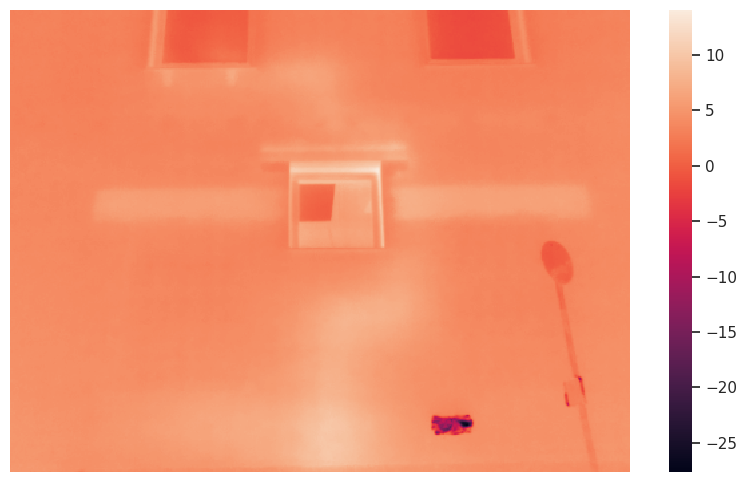

In [84]:
IRusingpweather = im2newtemp(imz1_path,
                                objEmissivity = 0.9,
                                appReflTemp_C = -10,
                                airTemp_C = p_temp,
                                airRelHumidity_perc = p_rh,
                                objDistance_m = p_distance)
plt.figure(figsize = (10,6))
sns.heatmap(IRusingpweather, annot=False, fmt=".2f", xticklabels=False, yticklabels=False)
print('Min temperature:')
print(IRusingpweather.min())
print('Max temperature:')
print(IRusingpweather.max())
print('Mean temperature:')
print(IRusingpweather.mean())

## FLIR One

In [52]:
flironeim, flironedic = getrawim_data('/content/FLIR_20230316_043404_931.jpg')

sensorR, sensorB, sensorF, sensorO, gGain = getCalParameters(flironedic)

atmAlpha1, atmAlpha2, atmBeta1, atmBeta2, atmX = getAtmParameters(flironedic)

    1 output files created


<ipython-input-29-5ae3ebe5950b>:15: RuntimeWarning: invalid value encountered in log
  objTemp_C=sensorB/np.log(sensorR/(gGain*(objRawSignal_DN+sensorO))+sensorF)-273.15;


nan
nan


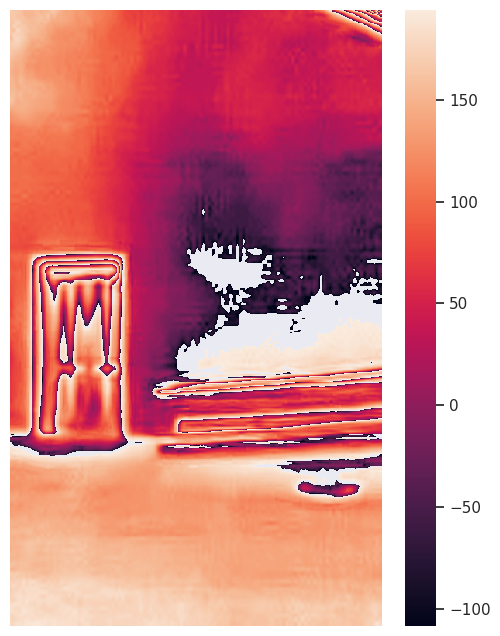

In [55]:
flironewidth, flironeheight = flironeim.size
flironesignalvalues = list(flironeim.getdata())
flironesignalvalues = np.array(flironesignalvalues).reshape((flironeheight, flironewidth))

flironefulltemp = FULLIRcounts2temp(3, 1, 50, 5, 0.9, flironesignalvalues)
plt.figure(figsize = (6,8))
sns.heatmap(flironefulltemp, annot=False, fmt=".2f", xticklabels=False, yticklabels=False)
print(flironefulltemp.min())
print(flironefulltemp.max())

    1 output files created
The User-set Parameters are the following:
Object Emissivity is 0.95
Reflected Apparent Temperature is 22.00 C
Atmospheric Temperature is 20.00 C
Relative Humidity is 50.00 %
Object distance is 1.00 m


<ipython-input-35-45190c1fa2cd>:94: RuntimeWarning: invalid value encountered in log
  objTemp_C=sensorB/np.log(sensorR/(gGain*(objRawSignal_DN+sensorO))+sensorF)-273.15;


nan
nan


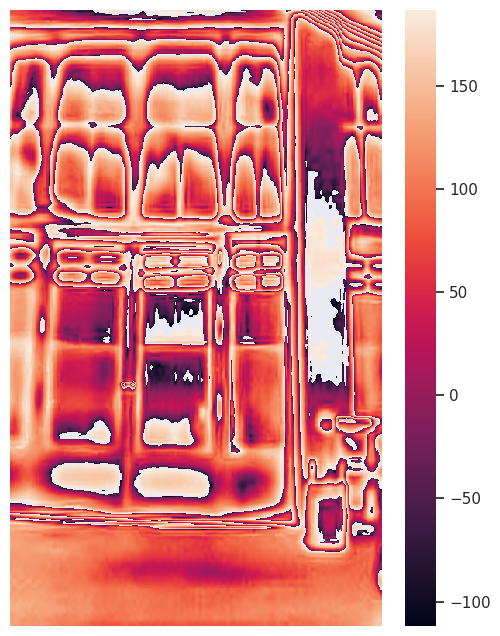

In [59]:
IRfulltempdifval = im2newtemp('/content/FLIR_20230316_043312_732.jpg')
plt.figure(figsize = (6,8))
sns.heatmap(IRfulltempdifval, annot=False, fmt=".2f", xticklabels=False, yticklabels=False)
print(IRfulltempdifval.min())
print(IRfulltempdifval.max())

    1 output files created
The User-set Parameters are the following:
Object Emissivity is 0.95
Reflected Apparent Temperature is 22.00 C
Atmospheric Temperature is 20.00 C
Relative Humidity is 50.00 %
Object distance is 1.00 m


<ipython-input-35-45190c1fa2cd>:94: RuntimeWarning: invalid value encountered in log
  objTemp_C=sensorB/np.log(sensorR/(gGain*(objRawSignal_DN+sensorO))+sensorF)-273.15;


nan
nan


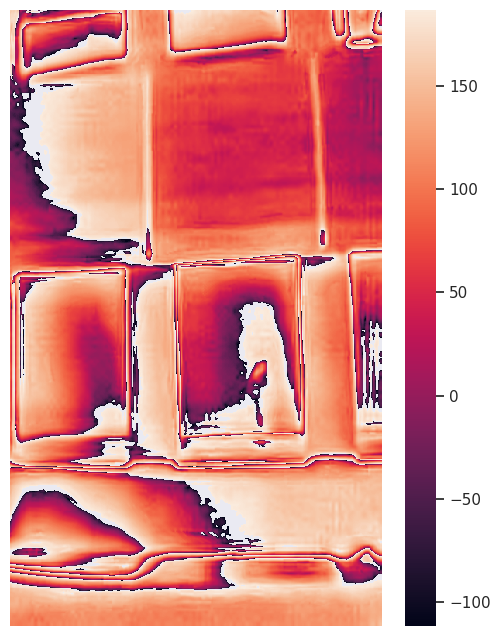

In [60]:
IRfulltempdifval = im2newtemp('/content/FLIR_20230316_054134_264.jpg')
plt.figure(figsize = (6,8))
sns.heatmap(IRfulltempdifval, annot=False, fmt=".2f", xticklabels=False, yticklabels=False)
print(IRfulltempdifval.min())
print(IRfulltempdifval.max())

Output file /content/FLIR_20230316_043404_931.png already exists for /content/FLIR_20230316_043404_931.jpg
    1 files could not be read
    0 output files created
[03/18 11:31:59 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/output/instancethermal_20240314_transforms_5000_all.pth ...


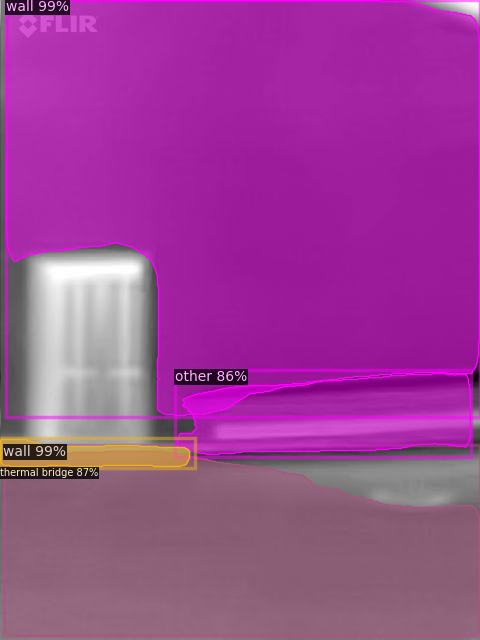

Weather conditions used:
{'distance': 10, 'relative humidity': 85, 'outside temperature': 1.2, 'wind speed': 0.08}
Emissivities used:
{'window': 0.9, 'window glazing': 0.837, 'window frame': 0.9, 'door': 0.9, 'door door': 0.9, 'door frame': 0.9, 'thermal bridge': 0.94, 'wall': 0.94}


NameError: name 'temp' is not defined

In [62]:
flirone = process_image('/content/FLIR_20230316_043404_931.jpg', p_weatherconditions, type_emiss, True, 0.8)


In [ ]:
flirone.style \
  .format(precision=2, thousands=",", decimal=".")

# Validation images

## Validation images paths

In [47]:
!cp /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/validation/images/img_20240224_045246_861.jpg /content/
!cp /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/validation/images/img_20240224_044444_401.jpg /content/
!cp /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/validation/images/img_20240224_051433_797.jpg /content/
!cp /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/validation/images/img_20240224_043150_838.jpg /content/
!cp /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/input/thermal23/darwin_files/content/thermal23/cms/validation/images/img_20240224_053252_903.jpg /content/

In [48]:
imz1_path = "/content/img_20240224_045246_861.jpg"
imz1_2_path = "/content/img_20240224_044444_401.jpg"
imz1_in_path = "/content/img_20240224_051433_797.jpg"
imz3_path = "/content/img_20240224_043150_838.jpg"
imz3_in_path = "/content/img_20240224_053252_903.jpg"

In [49]:
imz1 = Image.open(imz1_path)
imz1_2 = Image.open(imz1_2_path)
imz1_in = Image.open(imz1_in_path)
imz3 = Image.open(imz3_path)
imz3_in = Image.open(imz3_in_path)

In [63]:
# Get camera calibration parameters

flira50im, flira50dic = getrawim_data(imz1_path)

sensorR, sensorB, sensorF, sensorO, gGain = getCalParameters(flira50dic)

atmAlpha1, atmAlpha2, atmBeta1, atmBeta2, atmX = getAtmParameters(flira50dic)

Output file /content/img_20240224_045246_861.png already exists for /content/img_20240224_045246_861.jpg
    1 files could not be read
    0 output files created


## Inputs

In [118]:
# @title Enter publicly available weather conditions
p_distance = 10 # @param {type:"number"}
p_rh = 85 # @param {type:"number"}
p_temp = 1.2 # @param {type:"number"}
p_windspeed = 0.08 # @param {type:"number"}
# maxwindspeed = 1.38 # @param {type:"number"}

p_weatherconditions = {'distance' : p_distance,
                     'relative humidity' : p_rh,
                     'temperature' : p_temp,
                     'wind speed' : p_windspeed}

In [119]:
# @title Enter assumed emissivities and reflected apparent temperature
r_temp = -15 # @param {type:"number"}
emiss_wall = 0.9 # @param {type:"number"}
emiss_thermalbridge = 0.9 # @param {type:"number"}
emiss_door = 0.9 # @param {type:"number"}
emiss_doordoor = 0.9 # @param {type:"number"}
emiss_doorframe = 0.9 # @param {type:"number"}
emiss_window = 0.87 # @param {type:"number"}
emiss_windowglazing = 0.837 # @param {type:"number"}
emiss_windowframe = 0.9 # @param {type:"number"}

g_type_emiss = {'window' : emiss_window,
              'window glazing' : emiss_windowglazing,
              'window frame' : emiss_windowframe,
              'door' : emiss_door,
              'door door' : emiss_doordoor,
              'door frame' : emiss_doorframe,
              'thermal bridge' : emiss_thermalbridge,
              'wall' : emiss_wall,
              }


## Before segmentation

Output file /content/img_20240224_045246_861.png already exists for /content/img_20240224_045246_861.jpg
    1 files could not be read
    0 output files created
The User-set Parameters are the following:
Object Emissivity is 0.90
-27.62236159811647
14.023638947471568


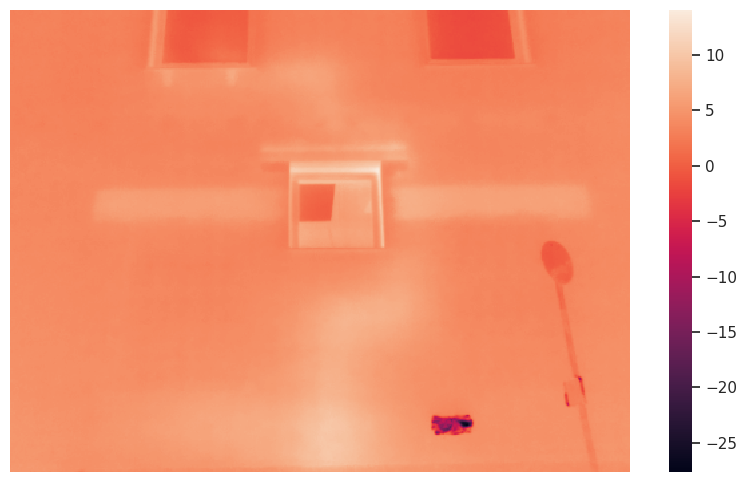

In [66]:
IRusingpweather = im2newtemp(imz1_path,
                                objEmissivity = 0.9,
                                appReflTemp_C = -10,
                                airTemp_C = p_temp,
                                airRelHumidity_perc = p_rh,
                                objDistance_m = p_distance)
plt.figure(figsize = (10,6))
sns.heatmap(IRusingpweather, annot=False, fmt=".2f", xticklabels=False, yticklabels=False)
print(IRusingpweather.min())
print(IRusingpweather.max())

## Z1

### Using public weather data and assumed emissivities


Output file /content/img_20240224_045246_861.png already exists for /content/img_20240224_045246_861.jpg
    1 files could not be read
    0 output files created
[03/18 12:19:13 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/output/instancethermal_20240314_transforms_5000_all.pth ...


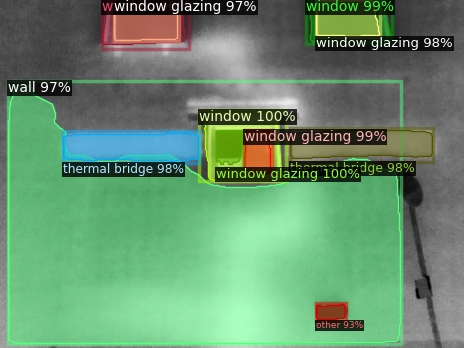

Weather conditions used:
{'distance': 10, 'relative humidity': 85, 'temperature': 1.2, 'wind speed': 0.08}
Emissivities used:
{'window': 0.9, 'window glazing': 0.837, 'window frame': 0.9, 'door': 0.9, 'door door': 0.9, 'door frame': 0.9, 'thermal bridge': 0.94, 'wall': 0.94}


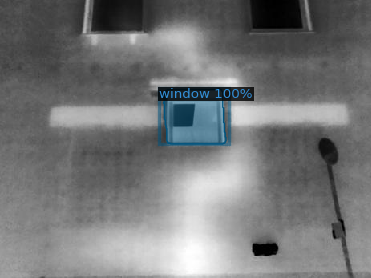

Average temperature for a window: 6.814 °C
with a prediction score of 99%
U value range is 1.51 to 1.22 for 18 °C to 22 °C


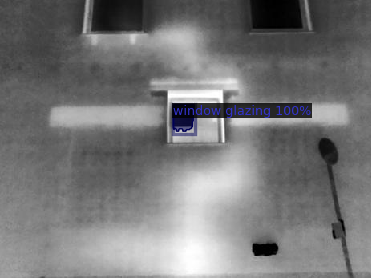

Average temperature for a window glazing: 3.278 °C
with a prediction score of 99%
U value range is 0.53 to 0.43 for 18 °C to 22 °C


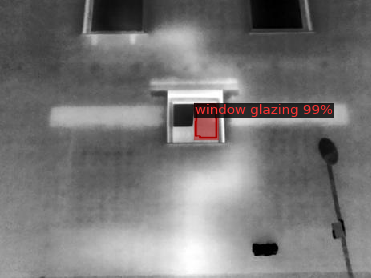

Average temperature for a window glazing: 8.289 °C
with a prediction score of 99%
U value range is 1.85 to 1.49 for 18 °C to 22 °C


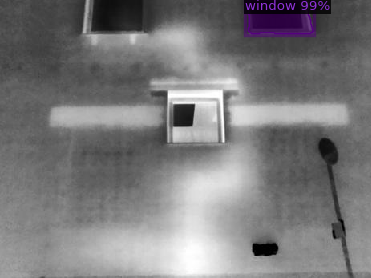

Average temperature for a window: 0.848 °C
with a prediction score of 99%
U value range is -0.09 to -0.07 for 18 °C to 22 °C


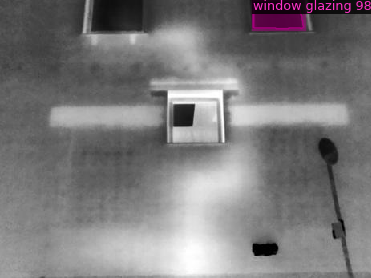

Average temperature for a window glazing: 0.182 °C
with a prediction score of 98%
U value range is -0.25 to -0.21 for 18 °C to 22 °C


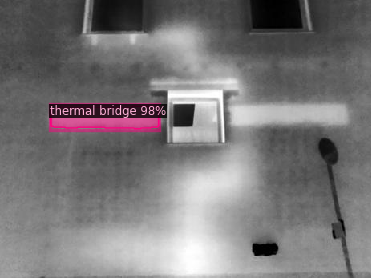

Average temperature for a thermal bridge: 5.852 °C
with a prediction score of 98%
U value range is 1.28 to 1.03 for 18 °C to 22 °C


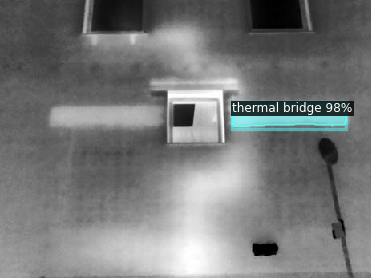

Average temperature for a thermal bridge: 6.464 °C
with a prediction score of 97%
U value range is 1.45 to 1.17 for 18 °C to 22 °C


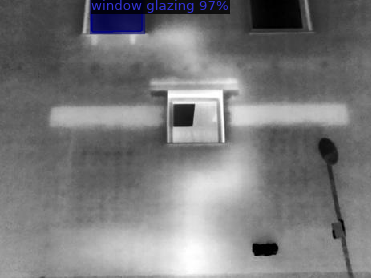

Average temperature for a window glazing: 1.951 °C
with a prediction score of 97%
U value range is 0.19 to 0.15 for 18 °C to 22 °C


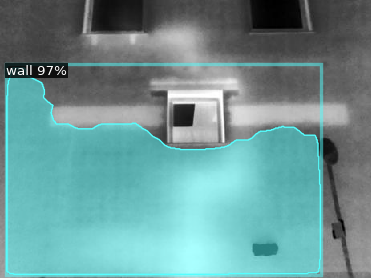

Average temperature for a wall: 5.181 °C
with a prediction score of 96%
U value range is 1.09 to 0.88 for 18 °C to 22 °C


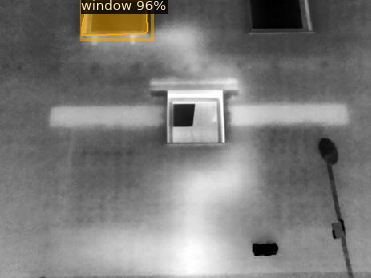

Average temperature for a window: 2.222 °C
with a prediction score of 96%
U value range is 0.27 to 0.22 for 18 °C to 22 °C


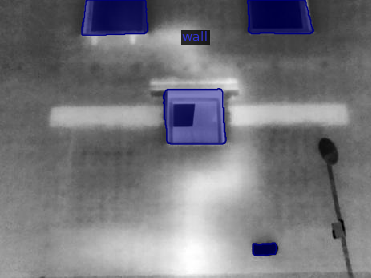

Average temperature for the whole wall: 4.669 °C
U value range is 0.95 to 0.77 for 18 °C to 22 °C


In [128]:
imz1_uval_df = process_image(imz1_path, p_weatherconditions, g_type_emiss, True)

In [129]:
imz1_uval_df.style \
  .format(precision=2, thousands=",", decimal=".")

,Class,Object emissivity,Average temperature (°C),U value for t_int,U value for 18 (°C),U value for 22 (°C)
0,window,0.87,6.81,1.35,1.51,1.22
1,window glazing,0.84,3.28,0.47,0.53,0.43
2,window glazing,0.84,8.29,1.65,1.85,1.49
3,window,0.87,0.85,-0.08,-0.09,-0.07
4,window glazing,0.84,0.18,-0.23,-0.25,-0.21
5,thermal bridge,0.90,5.85,1.15,1.28,1.03
6,thermal bridge,0.90,6.46,1.30,1.45,1.17
7,window glazing,0.84,1.95,0.17,0.19,0.15
8,wall,0.90,5.18,0.98,1.09,0.88
9,window,0.87,2.22,0.24,0.27,0.22


Output file /content/img_20240224_044444_401.png already exists for /content/img_20240224_044444_401.jpg
    1 files could not be read
    0 output files created
[03/18 12:19:41 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/output/instancethermal_20240314_transforms_5000_all.pth ...


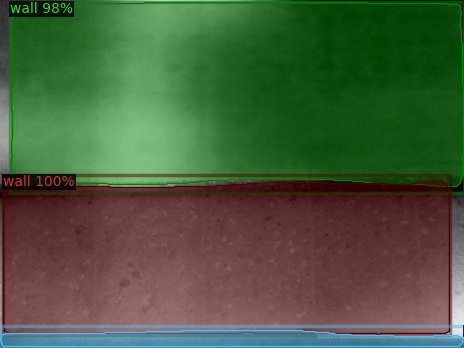

Weather conditions used:
{'distance': 10, 'relative humidity': 85, 'temperature': 1.2, 'wind speed': 0.08}
Emissivities used:
{'window': 0.9, 'window glazing': 0.837, 'window frame': 0.9, 'door': 0.9, 'door door': 0.9, 'door frame': 0.9, 'thermal bridge': 0.94, 'wall': 0.94}


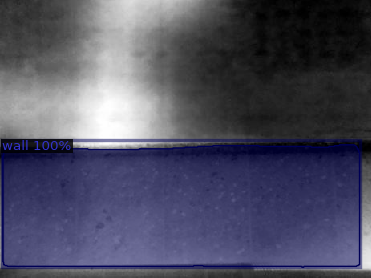

Average temperature for a wall: 7.297 °C
with a prediction score of 99%
U value range is 1.69 to 1.37 for 18 °C to 22 °C


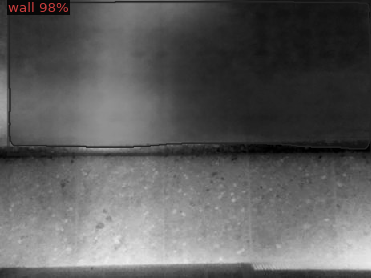

Average temperature for a wall: 6.486 °C
with a prediction score of 98%
U value range is 1.46 to 1.18 for 18 °C to 22 °C


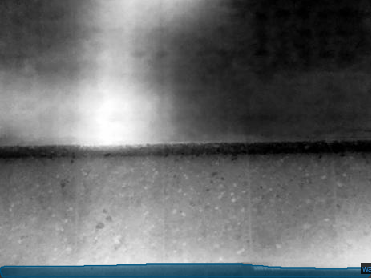

Average temperature for the whole wall: 6.832 °C
U value range is 1.56 to 1.26 for 18 °C to 22 °C


In [130]:
imz1_2_uval_df = process_image(imz1_2_path, p_weatherconditions, g_type_emiss, True)

In [131]:
imz1_2_uval_df.style \
  .format(precision=2, thousands=",", decimal=".")

,Class,Object emissivity,Average temperature (°C),U value for t_int,U value for 18 (°C),U value for 22 (°C)
0,wall,0.90,7.30,1.51,1.69,1.37
1,wall,0.90,6.49,1.31,1.46,1.18
2,wall,0.90,6.83,1.39,1.56,1.26


### With determined values

In [132]:
# @title Enter determined emissivity values and reflected apparent temperature
r_temp = -16.3 # @param {type:"number"}
emiss_wall = 0.94 # @param {type:"number"}
emiss_thermalbridge = 0.94 # @param {type:"number"}
emiss_door = 0.9 # @param {type:"number"}
emiss_doordoor = 0.9 # @param {type:"number"}
emiss_doorframe = 0.9 # @param {type:"number"}
emiss_window = 0.9 # @param {type:"number"}
emiss_windowglazing = 0.837 # @param {type:"number"}
emiss_windowframe = 0.9 # @param {type:"number"}

type_emiss = {'window' : emiss_window,
              'window glazing' : emiss_windowglazing,
              'window frame' : emiss_windowframe,
              'door' : emiss_door,
              'door door' : emiss_doordoor,
              'door frame' : emiss_doorframe,
              'thermal bridge' : emiss_thermalbridge,
              'wall' : emiss_wall,
              }


In [133]:
# @title Enter sensor data
distance = 10 # @param {type:"number"}
rh = 75.7 # @param {type:"number"}
temp = 2.6 # @param {type:"number"}
windspeed = 0.57 # @param {type:"number"}
# maxwindspeed = 0.33 # @param {type:"number"}

weatherconditions = {'distance' : distance,
                     'relative humidity' : rh,
                     'temperature' : temp,
                     'wind speed' : windspeed}

In [134]:
# @title Enter internal conditions
distance = 3 # @param {type:"number"}
rh = 38.3 # @param {type:"number"}
temp = 15.1 # @param {type:"number"}
windspeed = 0.02 # @param {type:"number"}
# maxwindspeed = 0.33 # @param {type:"number"}

internalconditions = {'distance' : distance,
                     'relative humidity' : rh,
                     'temperature' : temp,
                     'wind speed' : windspeed}

Output file /content/img_20240224_045246_861.png already exists for /content/img_20240224_045246_861.jpg
    1 files could not be read
    0 output files created
[03/18 12:19:54 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/output/instancethermal_20240314_transforms_5000_all.pth ...


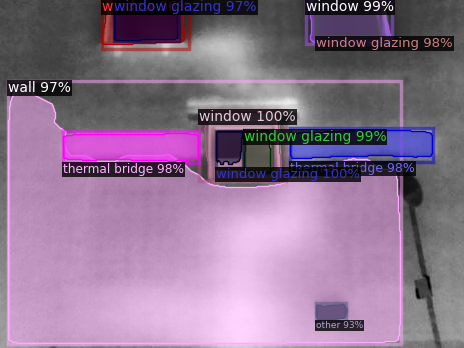

Weather conditions used:
{'distance': 10, 'relative humidity': 75.7, 'temperature': 2.6, 'wind speed': 0.57}
Emissivities used:
{'window': 0.9, 'window glazing': 0.837, 'window frame': 0.9, 'door': 0.9, 'door door': 0.9, 'door frame': 0.9, 'thermal bridge': 0.94, 'wall': 0.94}


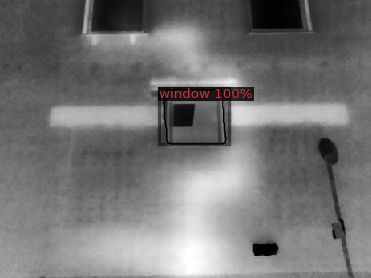

Average temperature for a window: 6.252 °C
with a prediction score of 99%
U value range is 1.55 to 1.23 for 18 °C to 22 °C


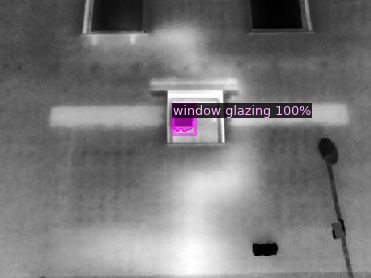

Average temperature for a window glazing: 3.442 °C
with a prediction score of 99%
U value range is 0.34 to 0.27 for 18 °C to 22 °C


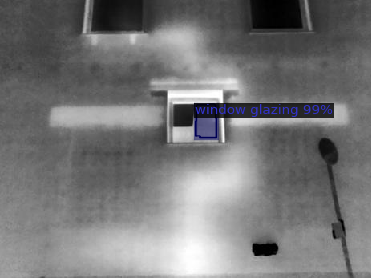

Average temperature for a window glazing: 8.443 °C
with a prediction score of 99%
U value range is 2.38 to 1.89 for 18 °C to 22 °C


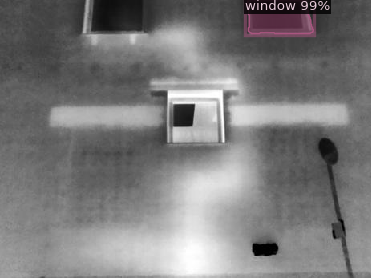

Average temperature for a window: 0.453 °C
with a prediction score of 99%
U value range is -0.89 to -0.71 for 18 °C to 22 °C


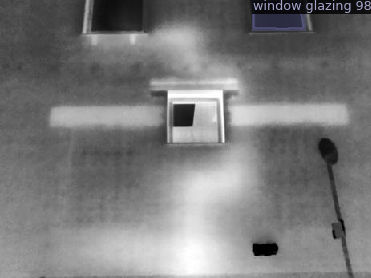

Average temperature for a window glazing: 0.353 °C
with a prediction score of 98%
U value range is -0.89 to -0.71 for 18 °C to 22 °C


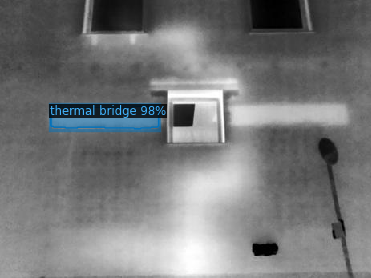

Average temperature for a thermal bridge: 5.097 °C
with a prediction score of 98%
U value range is 1.09 to 0.86 for 18 °C to 22 °C


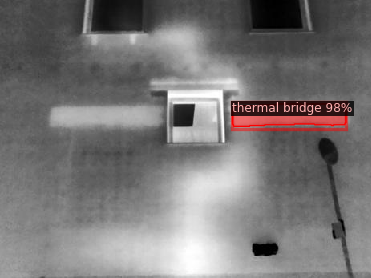

Average temperature for a thermal bridge: 5.689 °C
with a prediction score of 97%
U value range is 1.35 to 1.07 for 18 °C to 22 °C


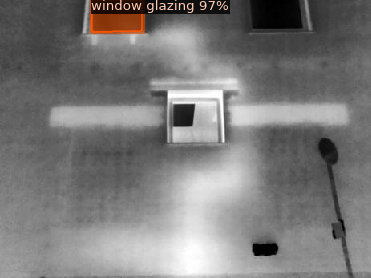

Average temperature for a window glazing: 2.118 °C
with a prediction score of 97%
U value range is -0.19 to -0.15 for 18 °C to 22 °C


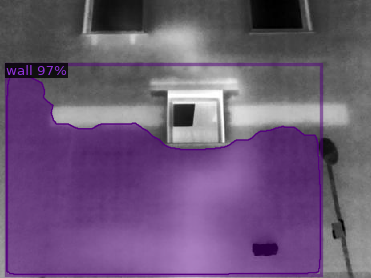

Average temperature for a wall: 4.450 °C
with a prediction score of 96%
U value range is 0.80 to 0.64 for 18 °C to 22 °C


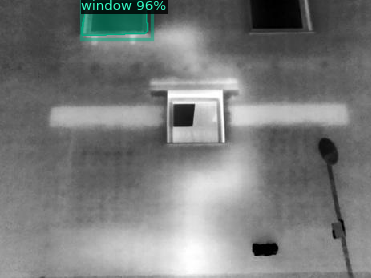

Average temperature for a window: 1.787 °C
with a prediction score of 96%
U value range is -0.34 to -0.27 for 18 °C to 22 °C


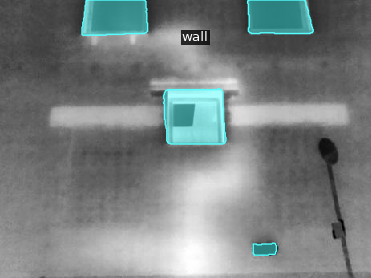

Average temperature for the whole wall: 3.956 °C
U value range is 0.59 to 0.47 for 18 °C to 22 °C


In [135]:
imz1_uval_df = process_image(imz1_path, weatherconditions, type_emiss, True, 0.9, internalconditions['temperature'])

In [136]:
imz1_uval_df.style \
  .format(precision=2, thousands=",", decimal=".")

,Class,Object emissivity,Average temperature (°C),U value for t_int,U value for 18 (°C),U value for 22 (°C)
0,window,0.90,6.25,1.91,1.55,1.23
1,window glazing,0.84,3.44,0.42,0.34,0.27
2,window glazing,0.84,8.44,2.93,2.38,1.89
3,window,0.90,0.45,-1.10,-0.89,-0.71
4,window glazing,0.84,0.35,-1.10,-0.89,-0.71
5,thermal bridge,0.94,5.10,1.34,1.09,0.86
6,thermal bridge,0.94,5.69,1.66,1.35,1.07
7,window glazing,0.84,2.12,-0.24,-0.19,-0.15
8,wall,0.94,4.45,0.99,0.80,0.64
9,window,0.90,1.79,-0.42,-0.34,-0.27


Output file /content/img_20240224_044444_401.png already exists for /content/img_20240224_044444_401.jpg
    1 files could not be read
    0 output files created
[03/18 12:20:21 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/output/instancethermal_20240314_transforms_5000_all.pth ...


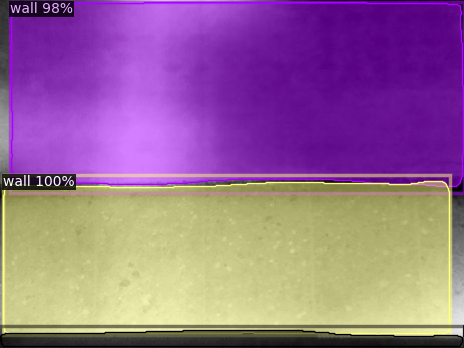

Weather conditions used:
{'distance': 10, 'relative humidity': 75.7, 'temperature': 2.6, 'wind speed': 0.57}
Emissivities used:
{'window': 0.9, 'window glazing': 0.837, 'window frame': 0.9, 'door': 0.9, 'door door': 0.9, 'door frame': 0.9, 'thermal bridge': 0.94, 'wall': 0.94}


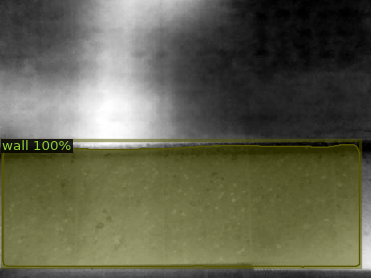

Average temperature for a wall: 6.493 °C
with a prediction score of 99%
U value range is 1.70 to 1.35 for 18 °C to 22 °C


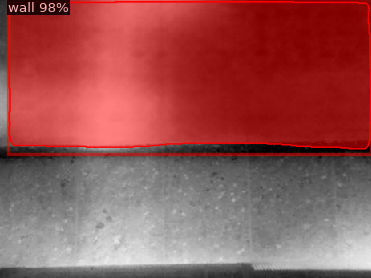

Average temperature for a wall: 5.710 °C
with a prediction score of 98%
U value range is 1.36 to 1.08 for 18 °C to 22 °C


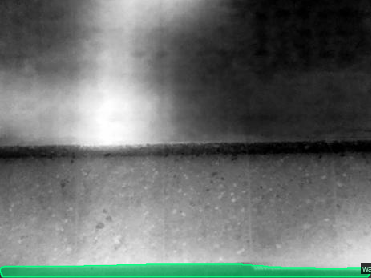

Average temperature for the whole wall: 6.044 °C
U value range is 1.50 to 1.19 for 18 °C to 22 °C


In [137]:
imz1_2_uval_df = process_image(imz1_2_path, weatherconditions, type_emiss, True, 0.9, internalconditions['temperature'])

In [138]:
imz1_2_uval_df.style \
  .format(precision=2, thousands=",", decimal=".")

,Class,Object emissivity,Average temperature (°C),U value for t_int,U value for 18 (°C),U value for 22 (°C)
0,wall,0.94,6.49,2.10,1.70,1.35
1,wall,0.94,5.71,1.67,1.36,1.08
2,wall,0.94,6.04,1.85,1.50,1.19


### Internal

Output file /content/img_20240224_051433_797.png already exists for /content/img_20240224_051433_797.jpg
    1 files could not be read
    0 output files created
[03/18 12:25:55 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/output/instancethermal_20240314_transforms_5000_all.pth ...


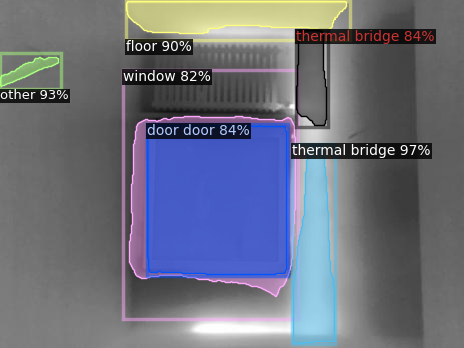

Weather conditions used:
{'distance': 3, 'relative humidity': 38.3, 'temperature': 15.1, 'wind speed': 0.02}
Emissivities used:
{'window': 0.9, 'window glazing': 0.837, 'window frame': 0.9, 'door': 0.9, 'door door': 0.9, 'door frame': 0.9, 'thermal bridge': 0.94, 'wall': 0.94}


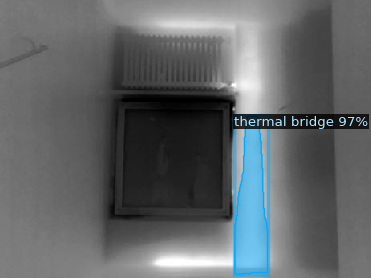

Average temperature for a thermal bridge: 31.668 °C
with a prediction score of 97%
U value range is 32.22 to 13.54 for 18 °C to 22 °C


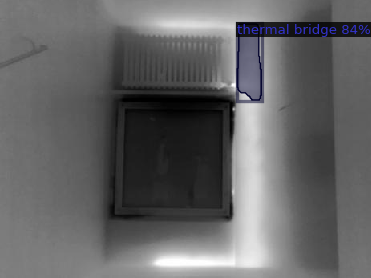

Average temperature for a thermal bridge: 32.035 °C
with a prediction score of 84%
U value range is 32.99 to 13.87 for 18 °C to 22 °C


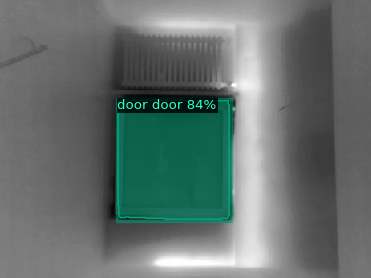

Average temperature for a door door: 17.052 °C
with a prediction score of 84%
U value range is 3.37 to 1.42 for 18 °C to 22 °C


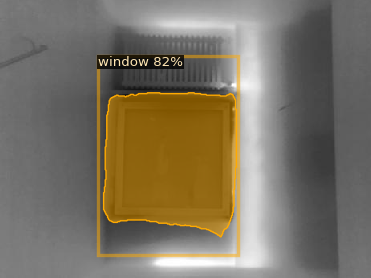

Average temperature for a window: 17.536 °C
with a prediction score of 81%
U value range is 4.22 to 1.77 for 18 °C to 22 °C


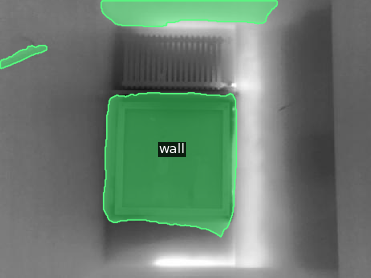

Average temperature for the whole wall: 21.878 °C
U value range is 12.54 to 5.27 for 18 °C to 22 °C


In [141]:
imz1_in_uval_df = process_image(imz1_in_path, internalconditions, type_emiss, True, 0.8, weatherconditions['temperature'])

In [142]:
imz1_in_uval_df.style \
  .format(precision=2, thousands=",", decimal=".")

,Class,Object emissivity,Average temperature (°C),U value for t_int,U value for 18 (°C),U value for 22 (°C)
0,thermal bridge,0.94,31.67,-7.47,32.22,13.54
1,thermal bridge,0.94,32.03,-7.65,32.99,13.87
2,door door,0.90,17.05,-0.78,3.37,1.42
3,window,0.90,17.54,-0.98,4.22,1.77
4,wall,0.94,21.88,-2.91,12.54,5.27


## Z3

### Using public weather data and assumed emissivities

    1 output files created
[03/18 12:32:37 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/output/instancethermal_20240314_transforms_5000_all.pth ...


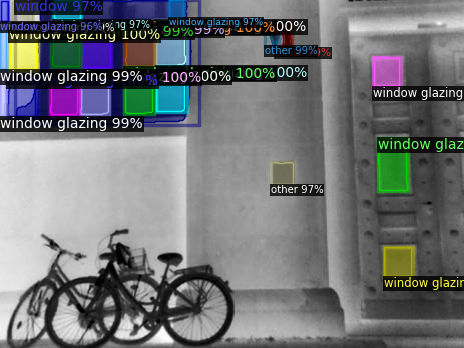

Weather conditions used:
{'distance': 10, 'relative humidity': 85, 'temperature': 1.2, 'wind speed': 0.08}
Emissivities used:
{'window': 0.9, 'window glazing': 0.837, 'window frame': 0.9, 'door': 0.9, 'door door': 0.9, 'door frame': 0.9, 'thermal bridge': 0.94, 'wall': 0.94}


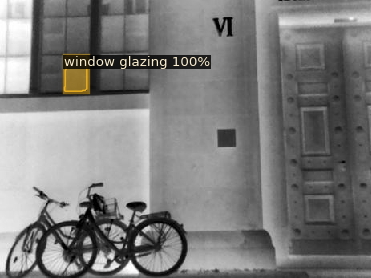

Average temperature for a window glazing: 7.332 °C
with a prediction score of 99%
U value range is 1.59 to 1.28 for 18 °C to 22 °C


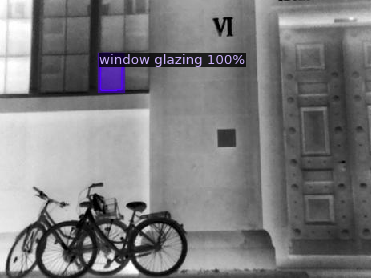

Average temperature for a window glazing: 7.892 °C
with a prediction score of 99%
U value range is 1.74 to 1.41 for 18 °C to 22 °C


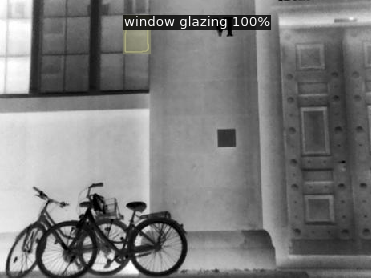

Average temperature for a window glazing: 8.673 °C
with a prediction score of 99%
U value range is 1.95 to 1.58 for 18 °C to 22 °C


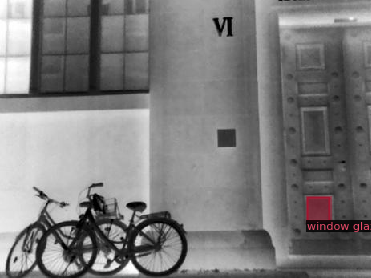

Average temperature for a window glazing: 7.674 °C
with a prediction score of 99%
U value range is 1.68 to 1.36 for 18 °C to 22 °C


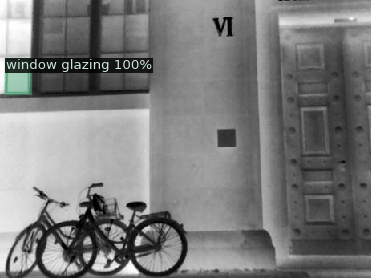

Average temperature for a window glazing: 12.243 °C
with a prediction score of 99%
U value range is 2.94 to 2.37 for 18 °C to 22 °C


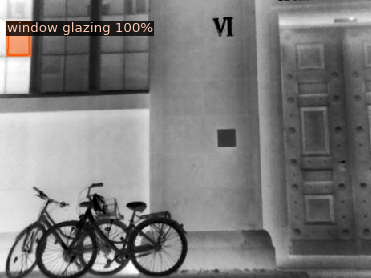

Average temperature for a window glazing: 12.249 °C
with a prediction score of 99%
U value range is 2.94 to 2.37 for 18 °C to 22 °C


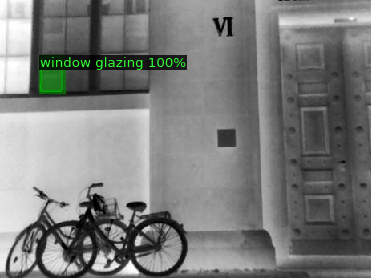

Average temperature for a window glazing: 7.492 °C
with a prediction score of 99%
U value range is 1.63 to 1.32 for 18 °C to 22 °C


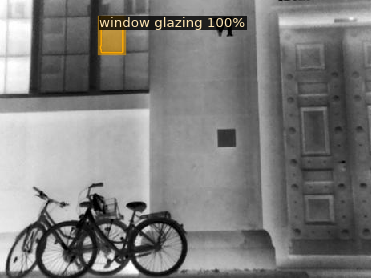

Average temperature for a window glazing: 8.467 °C
with a prediction score of 99%
U value range is 1.90 to 1.53 for 18 °C to 22 °C


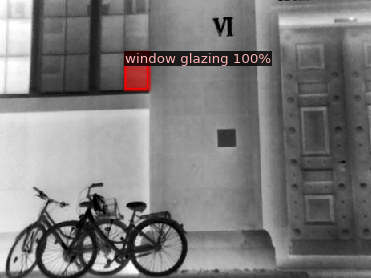

Average temperature for a window glazing: 8.107 °C
with a prediction score of 99%
U value range is 1.80 to 1.45 for 18 °C to 22 °C


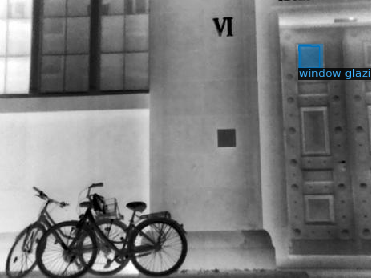

Average temperature for a window glazing: 8.254 °C
with a prediction score of 99%
U value range is 1.84 to 1.48 for 18 °C to 22 °C


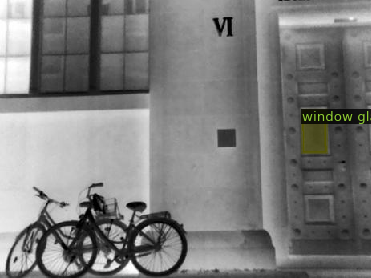

Average temperature for a window glazing: 7.543 °C
with a prediction score of 99%
U value range is 1.65 to 1.33 for 18 °C to 22 °C


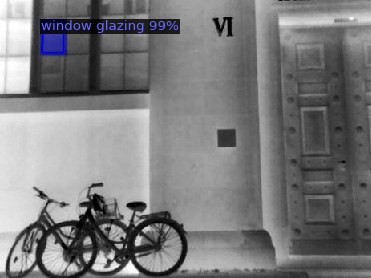

Average temperature for a window glazing: 8.182 °C
with a prediction score of 99%
U value range is 1.82 to 1.47 for 18 °C to 22 °C


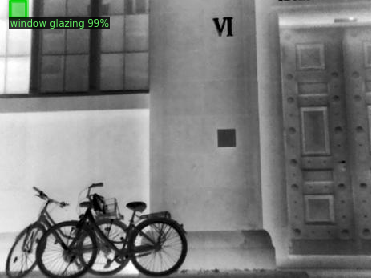

Average temperature for a window glazing: 11.664 °C
with a prediction score of 99%
U value range is 2.77 to 2.24 for 18 °C to 22 °C


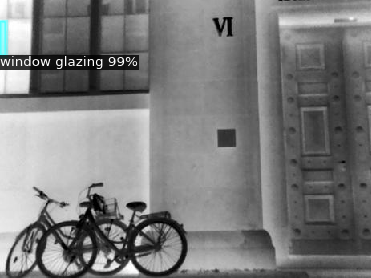

Average temperature for a window glazing: 12.800 °C
with a prediction score of 99%
U value range is 3.09 to 2.50 for 18 °C to 22 °C


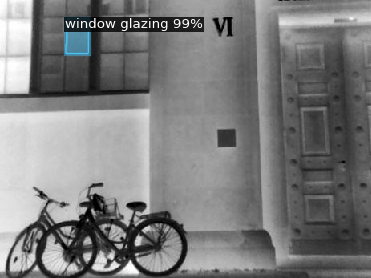

Average temperature for a window glazing: 7.969 °C
with a prediction score of 99%
U value range is 1.76 to 1.42 for 18 °C to 22 °C


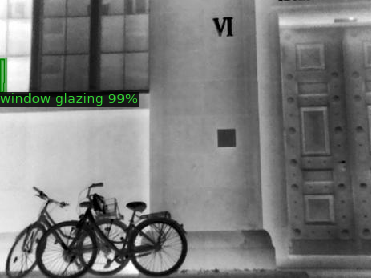

Average temperature for a window glazing: 12.708 °C
with a prediction score of 98%
U value range is 3.07 to 2.48 for 18 °C to 22 °C


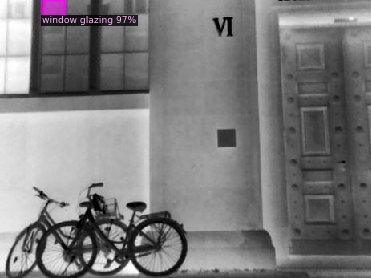

Average temperature for a window glazing: 8.677 °C
with a prediction score of 97%
U value range is 1.95 to 1.58 for 18 °C to 22 °C


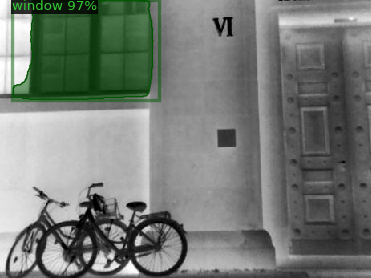

Average temperature for a window: 7.010 °C
with a prediction score of 97%
U value range is 1.56 to 1.26 for 18 °C to 22 °C


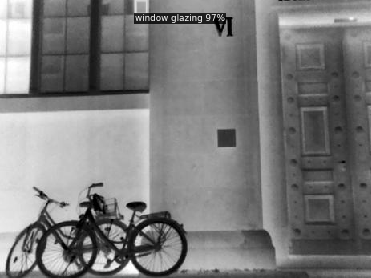

Average temperature for a window glazing: 8.288 °C
with a prediction score of 96%
U value range is 1.85 to 1.49 for 18 °C to 22 °C


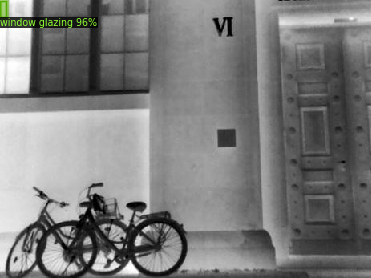

Average temperature for a window glazing: 12.832 °C
with a prediction score of 96%
U value range is 3.10 to 2.51 for 18 °C to 22 °C


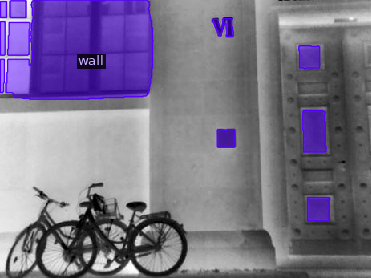

Average temperature for the whole wall: 7.228 °C
U value range is 1.67 to 1.35 for 18 °C to 22 °C


In [143]:
imz3_uval_df = process_image(imz3_path, p_weatherconditions, g_type_emiss, True, 0.95)

In [144]:
imz3_uval_df.style \
  .format(precision=2, thousands=",", decimal=".")

,Class,Object emissivity,Average temperature (°C),U value for t_int,U value for 18 (°C),U value for 22 (°C)
0,window glazing,0.84,7.33,1.42,1.59,1.28
1,window glazing,0.84,7.89,1.56,1.74,1.41
2,window glazing,0.84,8.67,1.74,1.95,1.58
3,window glazing,0.84,7.67,1.50,1.68,1.36
4,window glazing,0.84,12.24,2.62,2.94,2.37
5,window glazing,0.84,12.25,2.63,2.94,2.37
6,window glazing,0.84,7.49,1.46,1.63,1.32
7,window glazing,0.84,8.47,1.69,1.90,1.53
8,window glazing,0.84,8.11,1.61,1.80,1.45
9,window glazing,0.84,8.25,1.64,1.84,1.48


### With determined values

In [145]:
# @title Enter determined emissivity values and reflected apparent temperature
r_temp = -16.3 # @param {type:"number"}
emiss_wall = 0.94 # @param {type:"number"}
emiss_thermalbridge = 0.94 # @param {type:"number"}
emiss_door = 0.9 # @param {type:"number"}
emiss_doordoor = 0.9 # @param {type:"number"}
emiss_doorframe = 0.9 # @param {type:"number"}
emiss_window = 0.9 # @param {type:"number"}
emiss_windowglazing = 0.837 # @param {type:"number"}
emiss_windowframe = 0.9 # @param {type:"number"}

type_emiss = {'window' : emiss_window,
              'window glazing' : emiss_windowglazing,
              'window frame' : emiss_windowframe,
              'door' : emiss_door,
              'door door' : emiss_doordoor,
              'door frame' : emiss_doorframe,
              'thermal bridge' : emiss_thermalbridge,
              'wall' : emiss_wall,
              }


In [146]:
# @title Enter sensor data
distance = 5 # @param {type:"number"}
rh = 76.8 # @param {type:"number"}
temp = 2.7 # @param {type:"number"}
windspeed = 0.22 # @param {type:"number"}
# maxwindspeed = 0.33 # @param {type:"number"}

weatherconditions = {'distance' : distance,
                     'relative humidity' : rh,
                     'temperature' : temp,
                     'wind speed' : windspeed}

In [147]:
# @title Enter internal conditions
distance = 3 # @param {type:"number"}
rh = 43.2 # @param {type:"number"}
temp = 15.0 # @param {type:"number"}
windspeed = 0.05 # @param {type:"number"}
# maxwindspeed = 0.33 # @param {type:"number"}

internalconditions = {'distance' : distance,
                     'relative humidity' : rh,
                     'temperature' : temp,
                     'wind speed' : windspeed}

Output file /content/img_20240224_043150_838.png already exists for /content/img_20240224_043150_838.jpg
    1 files could not be read
    0 output files created
[03/18 12:33:25 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/output/instancethermal_20240314_transforms_5000_all.pth ...


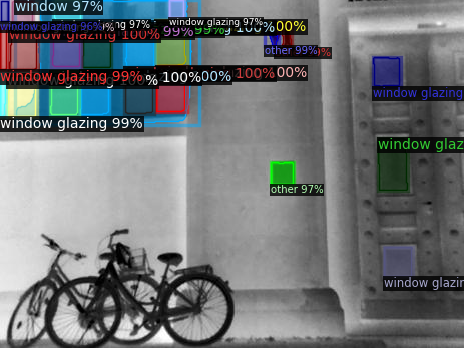

Weather conditions used:
{'distance': 5, 'relative humidity': 76.8, 'temperature': 2.7, 'wind speed': 0.22}
Emissivities used:
{'window': 0.9, 'window glazing': 0.837, 'window frame': 0.9, 'door': 0.9, 'door door': 0.9, 'door frame': 0.9, 'thermal bridge': 0.94, 'wall': 0.94}


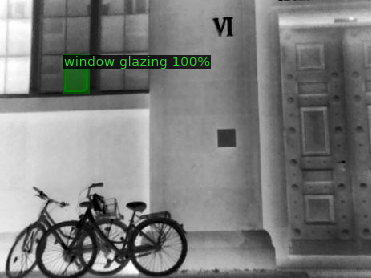

Average temperature for a window glazing: 7.288 °C
with a prediction score of 99%
U value range is 1.48 to 1.17 for 18 °C to 22 °C


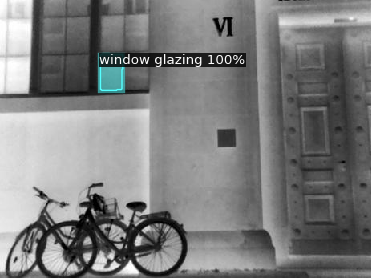

Average temperature for a window glazing: 7.845 °C
with a prediction score of 99%
U value range is 1.66 to 1.32 for 18 °C to 22 °C


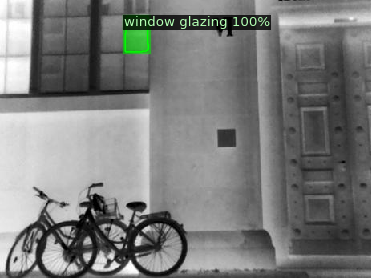

Average temperature for a window glazing: 8.621 °C
with a prediction score of 99%
U value range is 1.92 to 1.52 for 18 °C to 22 °C


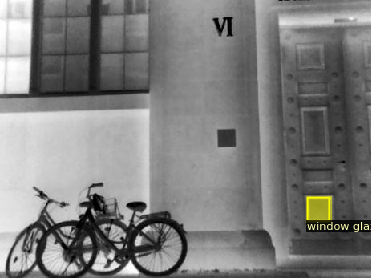

Average temperature for a window glazing: 7.628 °C
with a prediction score of 99%
U value range is 1.59 to 1.26 for 18 °C to 22 °C


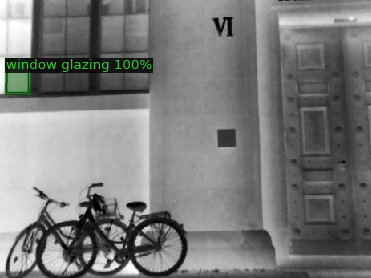

Average temperature for a window glazing: 12.172 °C
with a prediction score of 99%
U value range is 3.12 to 2.47 for 18 °C to 22 °C


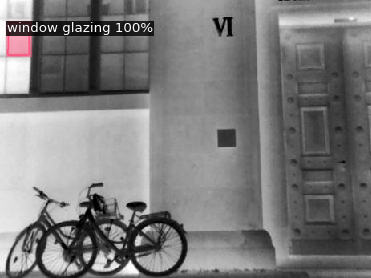

Average temperature for a window glazing: 12.177 °C
with a prediction score of 99%
U value range is 3.12 to 2.47 for 18 °C to 22 °C


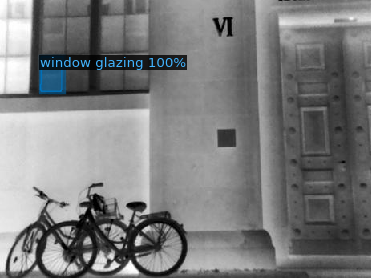

Average temperature for a window glazing: 7.447 °C
with a prediction score of 99%
U value range is 1.53 to 1.21 for 18 °C to 22 °C


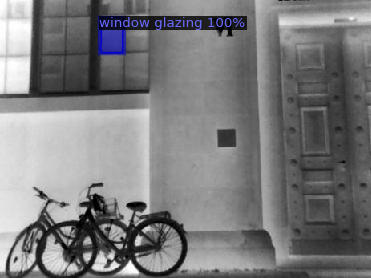

Average temperature for a window glazing: 8.416 °C
with a prediction score of 99%
U value range is 1.85 to 1.47 for 18 °C to 22 °C


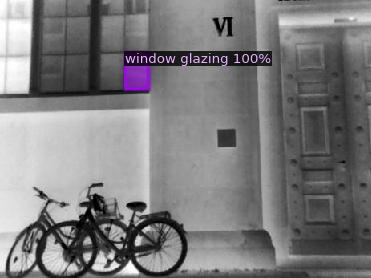

Average temperature for a window glazing: 8.058 °C
with a prediction score of 99%
U value range is 1.73 to 1.37 for 18 °C to 22 °C


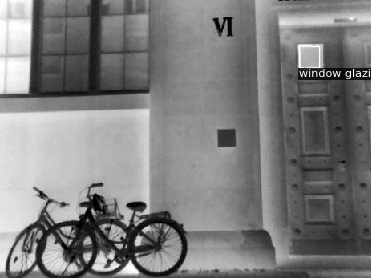

Average temperature for a window glazing: 8.204 °C
with a prediction score of 99%
U value range is 1.78 to 1.41 for 18 °C to 22 °C


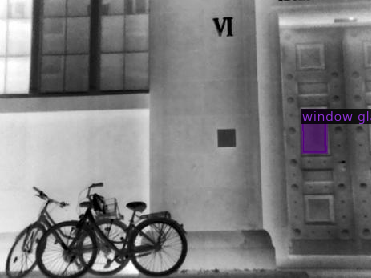

Average temperature for a window glazing: 7.497 °C
with a prediction score of 99%
U value range is 1.54 to 1.22 for 18 °C to 22 °C


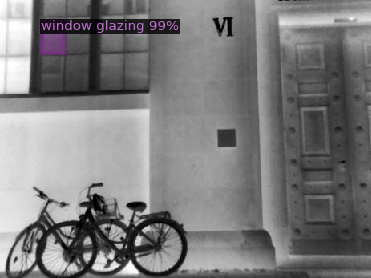

Average temperature for a window glazing: 8.133 °C
with a prediction score of 99%
U value range is 1.75 to 1.39 for 18 °C to 22 °C


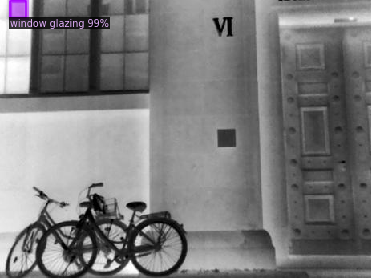

Average temperature for a window glazing: 11.596 °C
with a prediction score of 99%
U value range is 2.92 to 2.31 for 18 °C to 22 °C


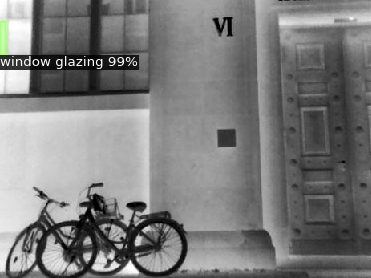

Average temperature for a window glazing: 12.726 °C
with a prediction score of 99%
U value range is 3.31 to 2.62 for 18 °C to 22 °C


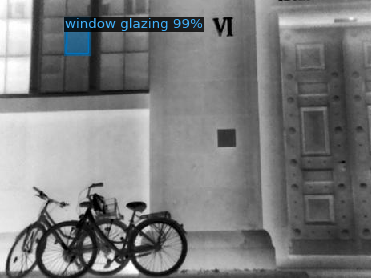

Average temperature for a window glazing: 7.921 °C
with a prediction score of 99%
U value range is 1.68 to 1.34 for 18 °C to 22 °C


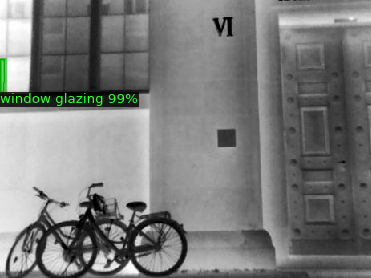

Average temperature for a window glazing: 12.635 °C
with a prediction score of 98%
U value range is 3.27 to 2.60 for 18 °C to 22 °C


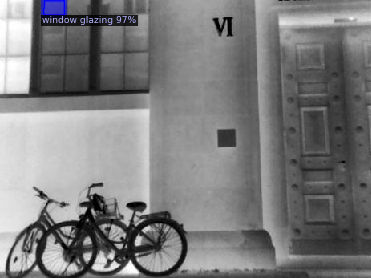

Average temperature for a window glazing: 8.625 °C
with a prediction score of 97%
U value range is 1.92 to 1.52 for 18 °C to 22 °C


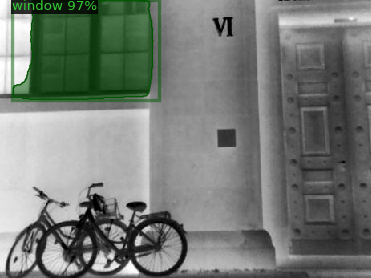

Average temperature for a window: 6.287 °C
with a prediction score of 97%
U value range is 1.22 to 0.97 for 18 °C to 22 °C


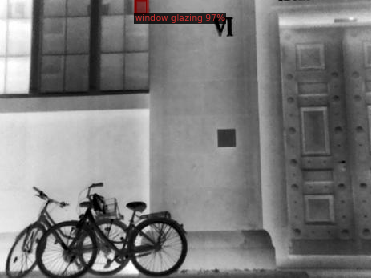

Average temperature for a window glazing: 8.239 °C
with a prediction score of 96%
U value range is 1.79 to 1.42 for 18 °C to 22 °C


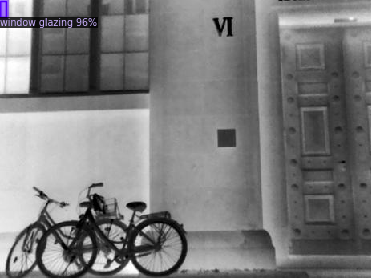

Average temperature for a window glazing: 12.757 °C
with a prediction score of 96%
U value range is 3.32 to 2.63 for 18 °C to 22 °C


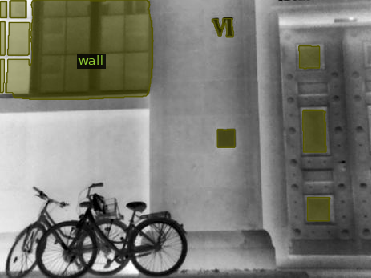

Average temperature for the whole wall: 6.305 °C
U value range is 1.27 to 1.01 for 18 °C to 22 °C


In [148]:
imz3_uval_df = process_image(imz3_path, weatherconditions, type_emiss, True, 0.95, internalconditions['temperature'])

In [149]:
imz3_uval_df.style \
  .format(precision=2, thousands=",", decimal=".")

,Class,Object emissivity,Average temperature (°C),U value for t_int,U value for 18 (°C),U value for 22 (°C)
0,window glazing,0.84,7.29,1.84,1.48,1.17
1,window glazing,0.84,7.84,2.06,1.66,1.32
2,window glazing,0.84,8.62,2.38,1.92,1.52
3,window glazing,0.84,7.63,1.98,1.59,1.26
4,window glazing,0.84,12.17,3.87,3.12,2.47
5,window glazing,0.84,12.18,3.88,3.12,2.47
6,window glazing,0.84,7.45,1.90,1.53,1.21
7,window glazing,0.84,8.42,2.30,1.85,1.47
8,window glazing,0.84,8.06,2.15,1.73,1.37
9,window glazing,0.84,8.20,2.21,1.78,1.41


### Internal

    1 output files created
[03/18 12:34:13 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/TUM/Thesis/Thermal/ModelTraining/output/instancethermal_20240314_transforms_5000_all.pth ...


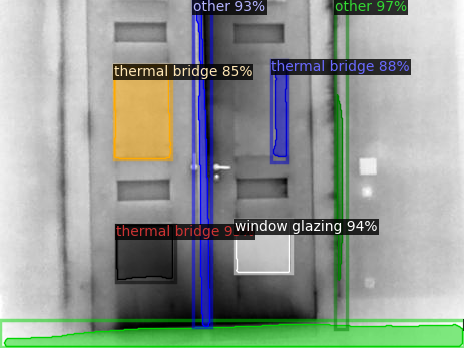

Weather conditions used:
{'distance': 3, 'relative humidity': 43.2, 'temperature': 15.0, 'wind speed': 0.05}
Emissivities used:
{'window': 0.9, 'window glazing': 0.837, 'window frame': 0.9, 'door': 0.9, 'door door': 0.9, 'door frame': 0.9, 'thermal bridge': 0.94, 'wall': 0.94}


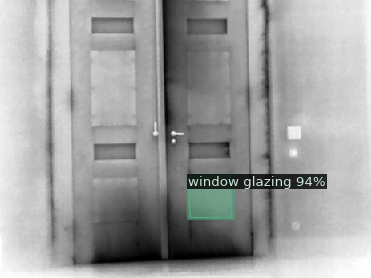

Average temperature for a window glazing: 16.830 °C
with a prediction score of 94%
U value range is 2.91 to 1.25 for 18 °C to 22 °C


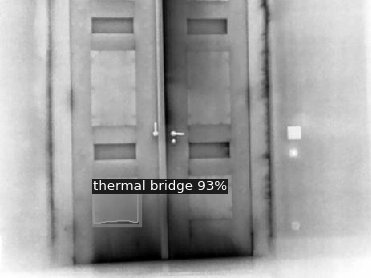

Average temperature for a thermal bridge: 13.108 °C
with a prediction score of 92%
U value range is -3.31 to -1.42 for 18 °C to 22 °C


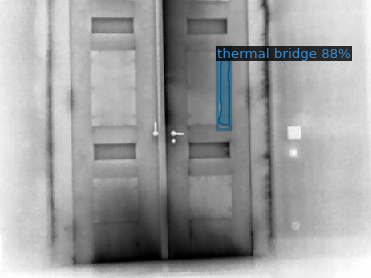

Average temperature for a thermal bridge: 14.005 °C
with a prediction score of 87%
U value range is -1.75 to -0.75 for 18 °C to 22 °C


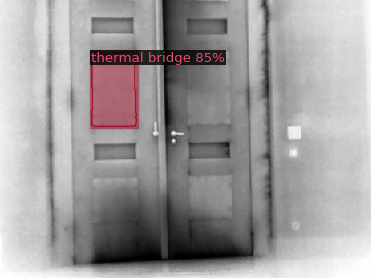

Average temperature for a thermal bridge: 14.883 °C
with a prediction score of 84%
U value range is -0.21 to -0.09 for 18 °C to 22 °C


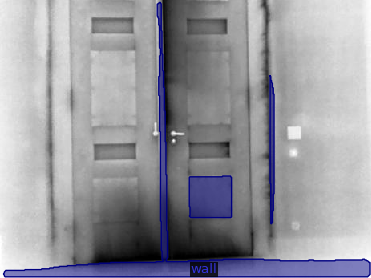

Average temperature for the whole wall: 14.215 °C
U value range is -1.38 to -0.59 for 18 °C to 22 °C


In [150]:
imz3_in_uval_df = process_image(imz3_in_path, internalconditions, type_emiss, True, 0.8, weatherconditions['temperature'])

In [151]:
imz3_in_uval_df.style \
  .format(precision=2, thousands=",", decimal=".")

,Class,Object emissivity,Average temperature (°C),U value for t_int,U value for 18 (°C),U value for 22 (°C)
0,window glazing,0.84,16.83,-0.71,2.91,1.25
1,thermal bridge,0.94,13.11,0.81,-3.31,-1.42
2,thermal bridge,0.94,14.00,0.43,-1.75,-0.75
3,thermal bridge,0.94,14.88,0.05,-0.21,-0.09
4,wall,0.94,14.21,0.34,-1.38,-0.59
